# Practical work 3: 2D sampling and aliasing 

Properties studied in 1D apply in 2D. The following results can be admitted: 
 - given a regular grid, a sampling of a continuous 2D signal can be modelled as follow:
$$
x_e(t,u) = x(t,u)e(t,u)\quad \text{with}\quad e(t,u) = \sum_{k=-\infty}^{+\infty} \sum_{l=-\infty}^{+\infty} \delta(t-kT_e,u - lT_e)
$$ $e$ is the analog of Dirac comb (also called impulse train) in 2D
 - spectrum of $x_e$ writes:
$$
X_e(f,g) = \frac1{T_e^2}\sum_{k=-\infty}^{+\infty} \sum_{l=-\infty}^{+\infty} X(f-kf_e,g-lf_e)
$$
2D sampling then implies a periodisation of the spectrum for the two dimensions
 - it is possible to reconstruct the original signal from the sampled signal if 2D Shannon condition is verified (band limited signal) with:
$$
x_r (t,u) = \sum_{k=-\infty}^{+\infty} \sum_{l=\infty}^{+\infty} x_e(kT_e,lT_e) \operatorname{sinc}(\pi f_e (t-kT_e)) \operatorname{sinc}(\pi f_e(u - lT_e))\qquad\qquad\qquad\text{(1)}
$$
so called Shannon interpolation.
 
## Exercice 1: aliasing and windowing of 2D signals
 
Given the following signal:
$$
s_\theta(t,u) = A\cos(2\pi f_0(t\cos\theta + u\sin\theta))
$$
Here an example with $\theta=\frac\pi4$:
<div>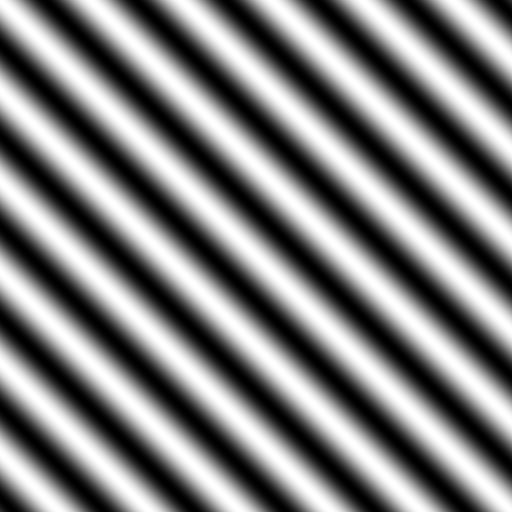</div>
The goal of this exercice is to study the limit conditions of sampling of this image in order to avoid aliasing.

In [63]:
import numpy as np
from numpy.fft import fft2, fftshift
import matplotlib.pyplot as plt
# for interactive ploting, see surf() below
%matplotlib notebook 
from matplotlib import cm
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D

def sinusoid2d(A, theta, size, T0, Te):
    """ double**2*int*double**2 -> Array[double] """
    ct = np.cos(theta/180*np.pi)
    st = np.sin(theta/180*np.pi)
    x, y = np.meshgrid(np.arange(0, size, Te), np.arange(0, size, Te))
    return A*np.cos(2*np.pi*(y*ct - x*st)/T0)

def shannonInterpolation(I, Te, size):
    """ Array*int*double -> Array[double] """
    n, m = I.shape
    x, y = np.meshgrid(np.arange(0, size), np.arange(0, n))
    Y = np.sinc(x/Te-y)
    x, y = np.meshgrid(np.arange(0, size), np.arange(0, m))
    X = np.sinc(x/Te-y)
    return np.matmul(X.T, np.matmul(I, Y))

def imshow(I,title=None):
    """ display an image """
    plt.figure(figsize=(500//80,500//80))
    plt.gray()
    plt.imshow(I)
    if title: plt.title(title)
    plt.show()

def surf(Z,title=None):
    """ 3D plot of an image """
    X,Y = np.meshgrid(range(Z.shape[1]), range(Z.shape[0]))
    fig = plt.figure(figsize=(600/80,600/80))
    if title: plt.title(title)
    ax = fig.gca(projection='3d')
    ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
    plt.show()
    

    

1. We provide the function `sinusoid2d(A, theta, L, T0, Te)` that allows to sample signal $s_\theta$ with a sampling period of `Te` (the grid is regular with the sample sampling value for directions $u$ and $t$). Paremeters `A`, `theta`, `L` and `T0` respectively control the amplitude, orientation and period ($T_0=\frac1{f_0}$) of signal $s_\theta$. Generate a pseudo continuous signal $s_{45}$ with `A=1`, `theta = 45`, `L = 512`, `T0 = 64` and `T_e=1`.


<IPython.core.display.Javascript object>


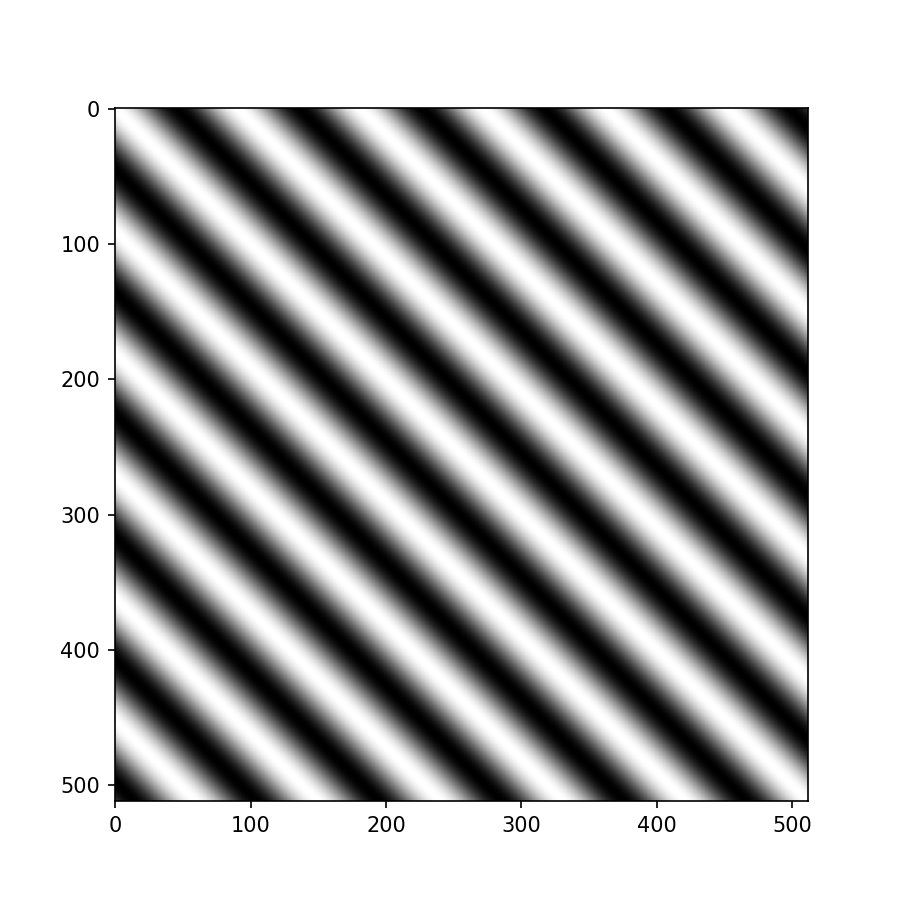

In [64]:
signalSampled=sinusoid2d(1,45,512,64,1)
imshow(signalSampled)


2. What is the maximal fre
quency of previous signal $s_{45}$ in direction $t$ (denoted $f_t^{\text{max}}$) and direction $u$ (denoted $f_u^{\text{max}}$)? Let $f_m = \max(f_t^{\text{max}},f_u^{\text{max}})$. Explain why $f_m$ is the limit frequency (in sens of Shannon) for the sampling of $s_{45}$.

2. (a)  Sample $s_{45}$ with $f_e = 16 f_m$ and display the sampled signal.

<IPython.core.display.Javascript object>


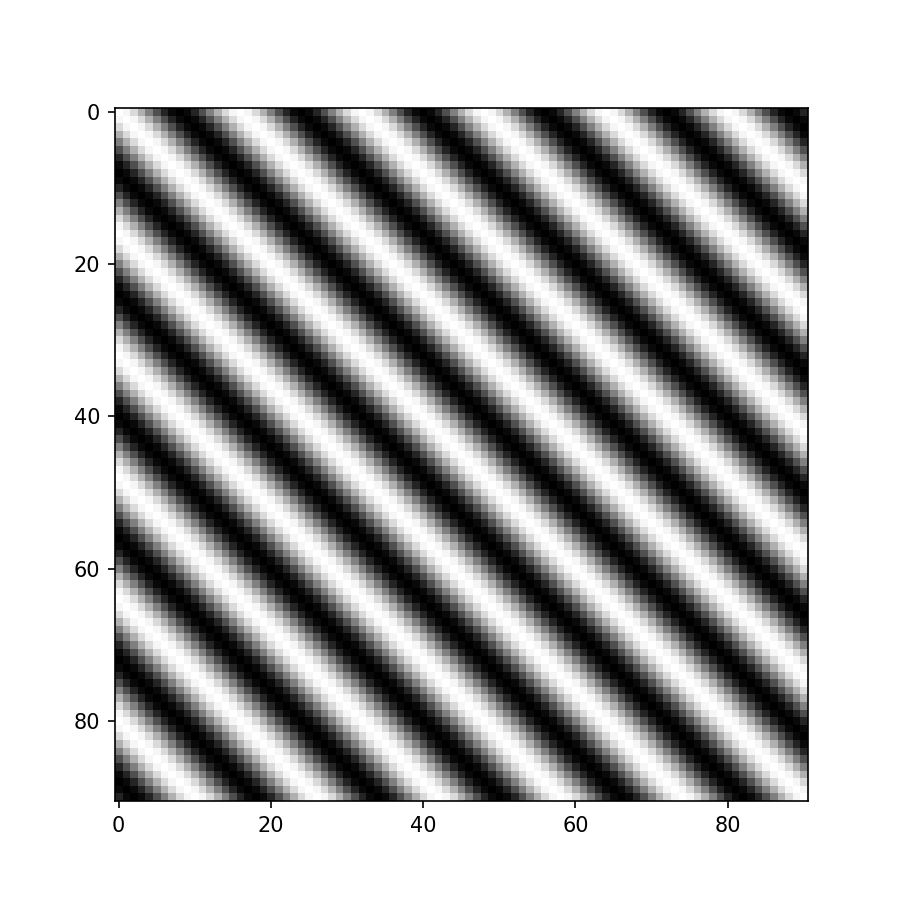

In [65]:
#  Te=T0/16   car Fe=16Fm   Te=1/Fe=1/(16*Fm)
Fm=0.01104854345
Te=1/(16*Fm)
signalSampled=sinusoid2d(1,45,512,64,Te) 
imshow(signalSampled)


2. (b) Compute the Fourier transform of the sampled signal and display frequencies. One can use `surf()` function for an interactive 3D plot.

In [66]:
def toVisualizeFT(If):
    """ Array[complex] -> Array[float] """
    return np.fft.fftshift(np.abs(If))

def toVisualizeLogFT(If):
    """ Array[complex] -> Array[float] """
    return np.fft.fftshift(np.log(1+np.abs(If)))

La TF du signal échantillonné avec Fe=16


<IPython.core.display.Javascript object>


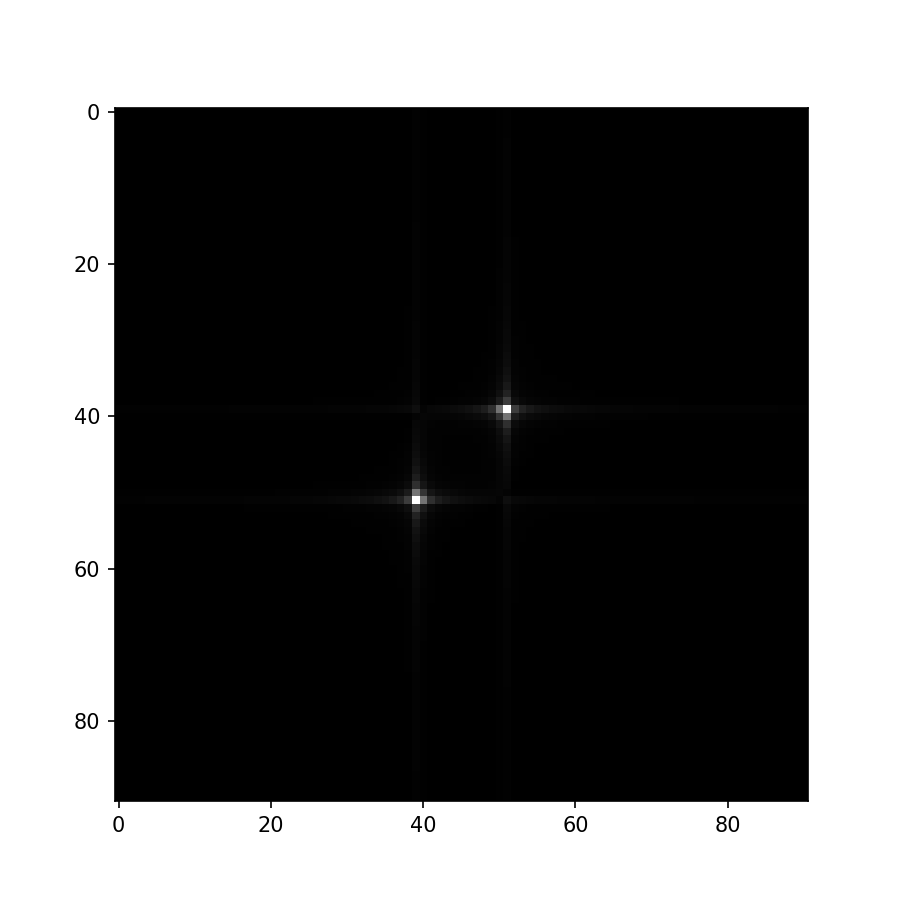

<IPython.core.display.Javascript object>


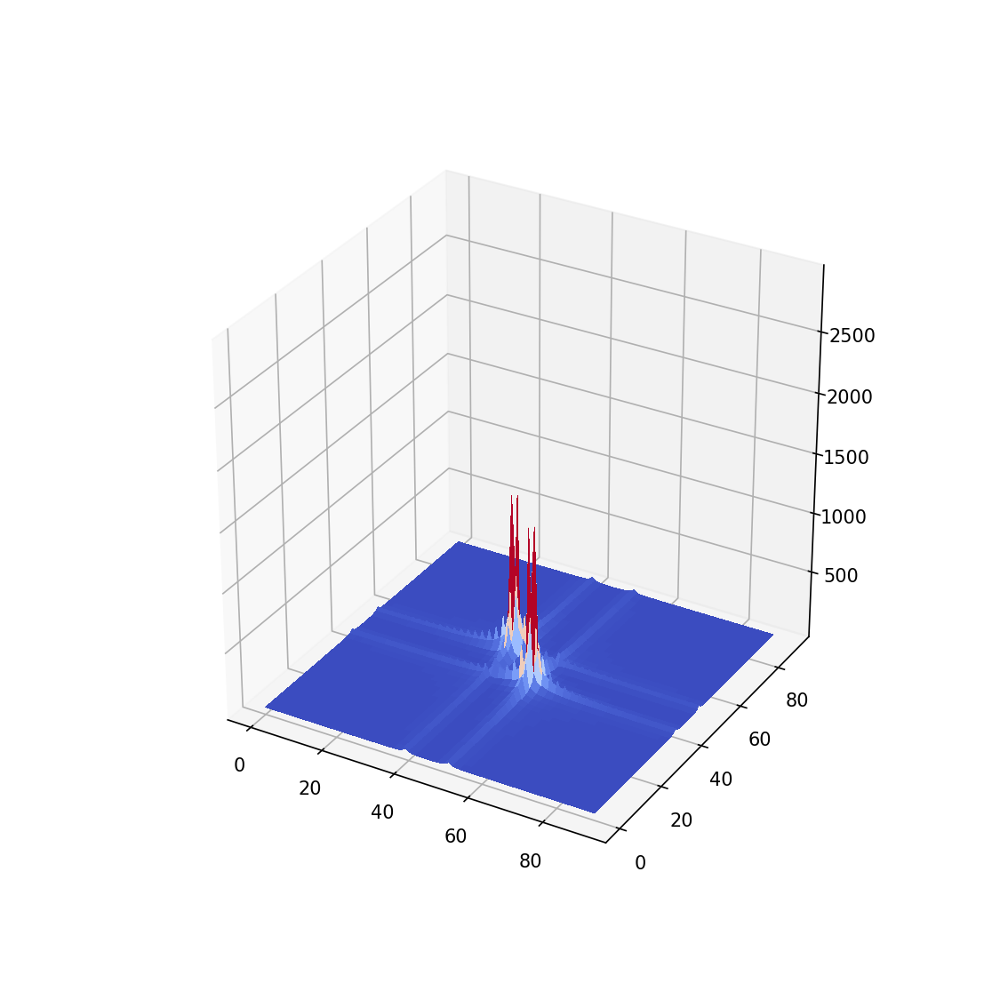

La TF du signal échantillonné avec Fe=16 avec une échelle logarithmique :


<IPython.core.display.Javascript object>


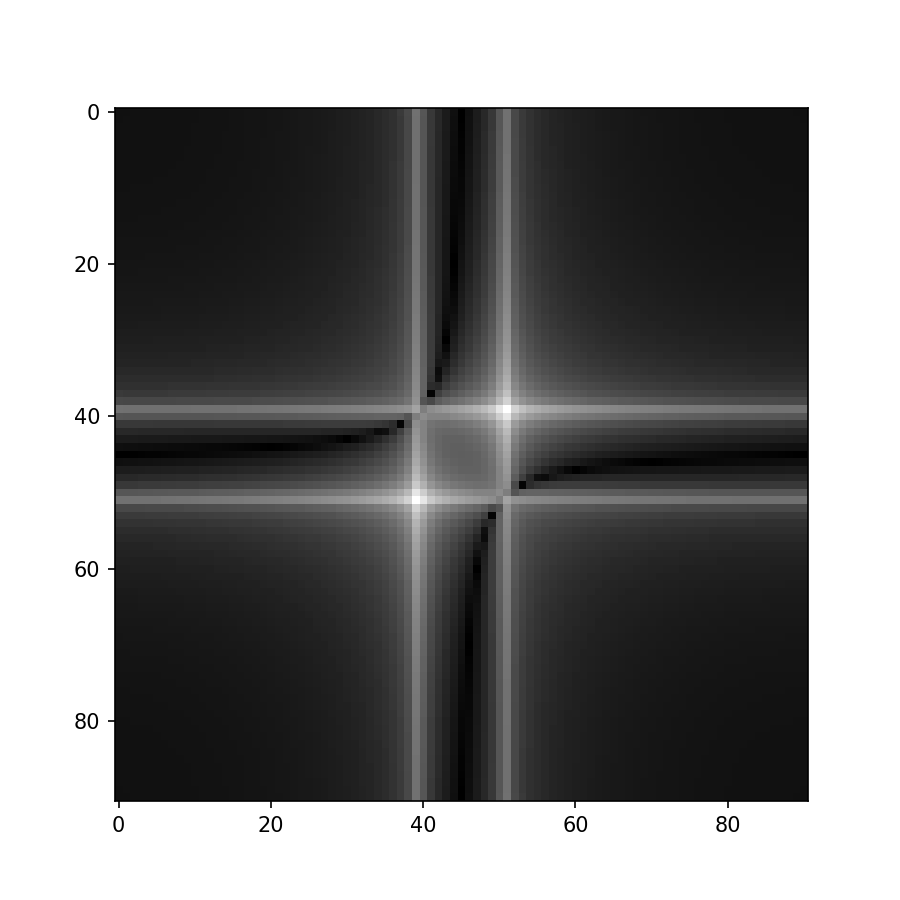

<IPython.core.display.Javascript object>


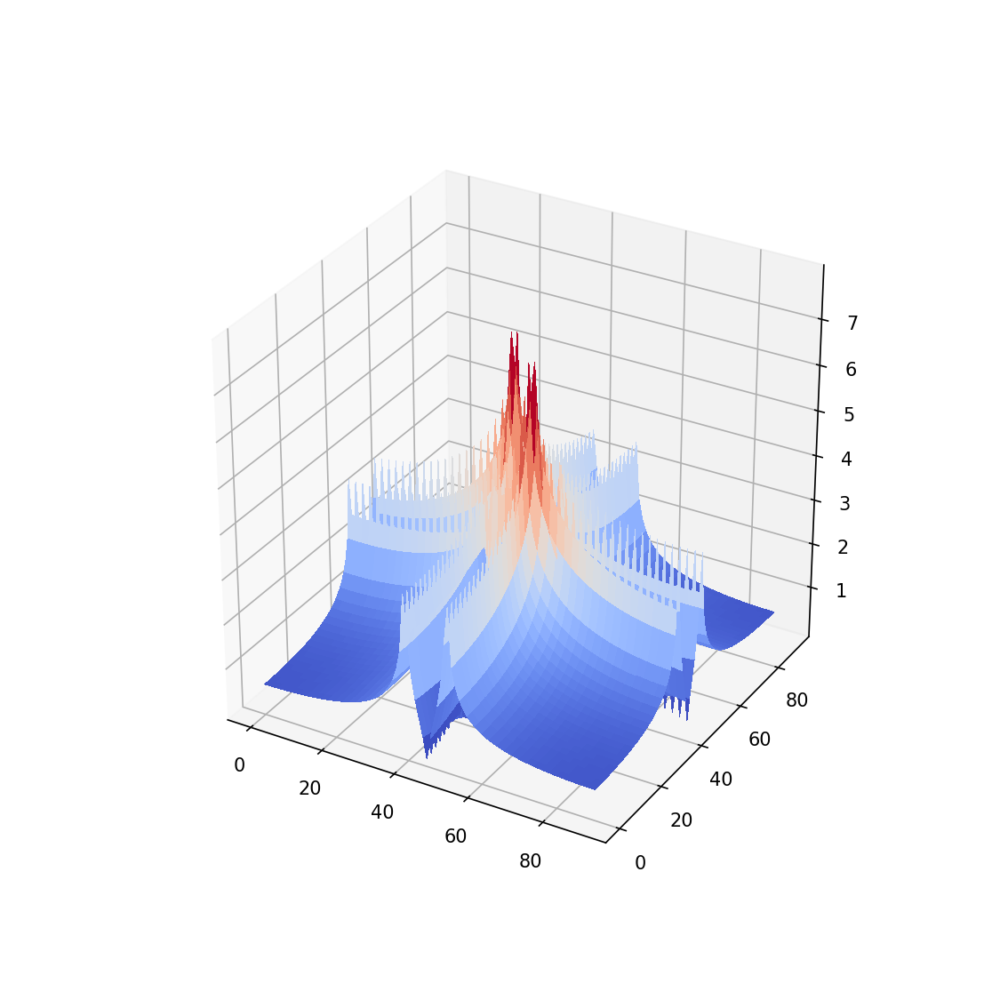

In [67]:
Fm=0.01104854345
Te=1/(16*Fm)
signalSampled=sinusoid2d(1,45,512,64,Te)

print("La TF du signal échantillonné avec Fe=16")
fourierSignal=fft2(signalSampled)
imshow(toVisualizeFT(fourierSignal))
surf(toVisualizeFT(fourierSignal))

print("La TF du signal échantillonné avec Fe=16 avec une échelle logarithmique :")
fourierSignal=fft2(signalSampled)
imshow(toVisualizeLogFT(fourierSignal))
surf(toVisualizeLogFT(fourierSignal))

2. (c) Comment the spectrum:
    - verify the presence of the two Dirac peaks
    - for various values of $T_e$, observe changes in the spectrum. Compare with the spectrum of the continuous signal ($s_{45}$). What is the origin of theses differences?
    - (Bonus question):
        - Why, aside the two Dirac peaks, there are somes structures? Explain the origin of these lobes.
        - Increase $T_0$ in order to obtain a unique peak. Explain the origin of this fusion. Verify the limit value of $T_0$ for which the two peaks interfer.

3. (a) Sample $s_{45}$ with $f_0=4 f_m$ and display the sampled signal.

Le signal échantillonné :



<IPython.core.display.Javascript object>


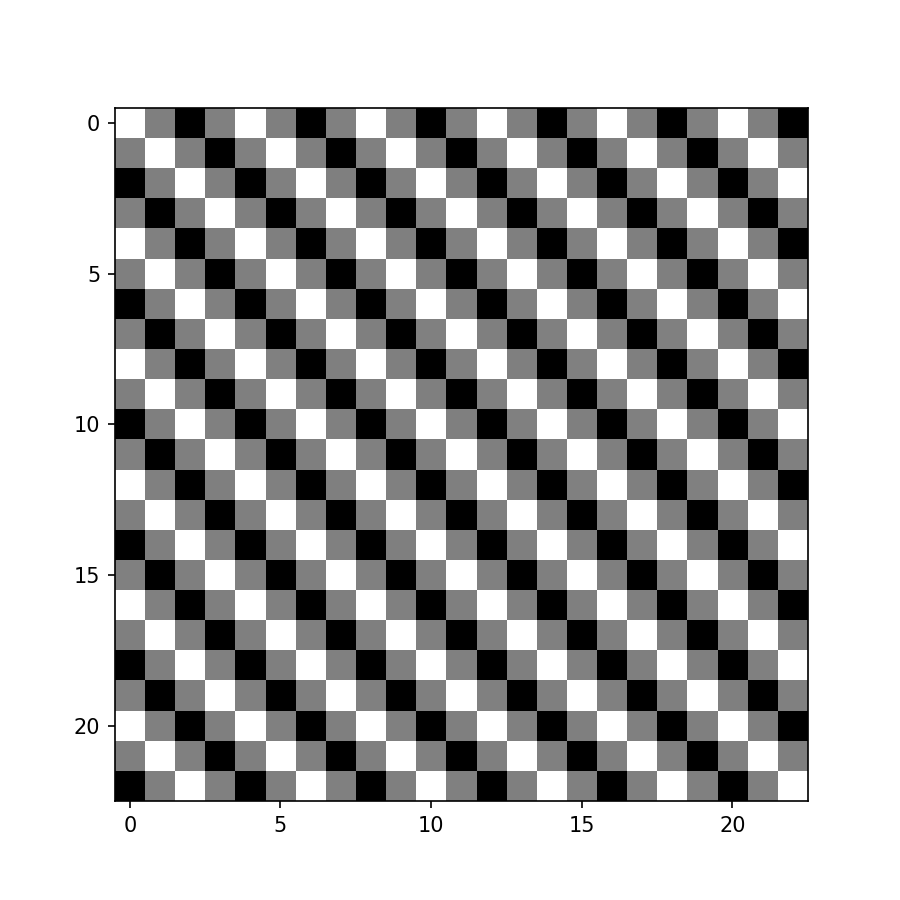

Le signal échantillonné aprés reconstruction :



<IPython.core.display.Javascript object>


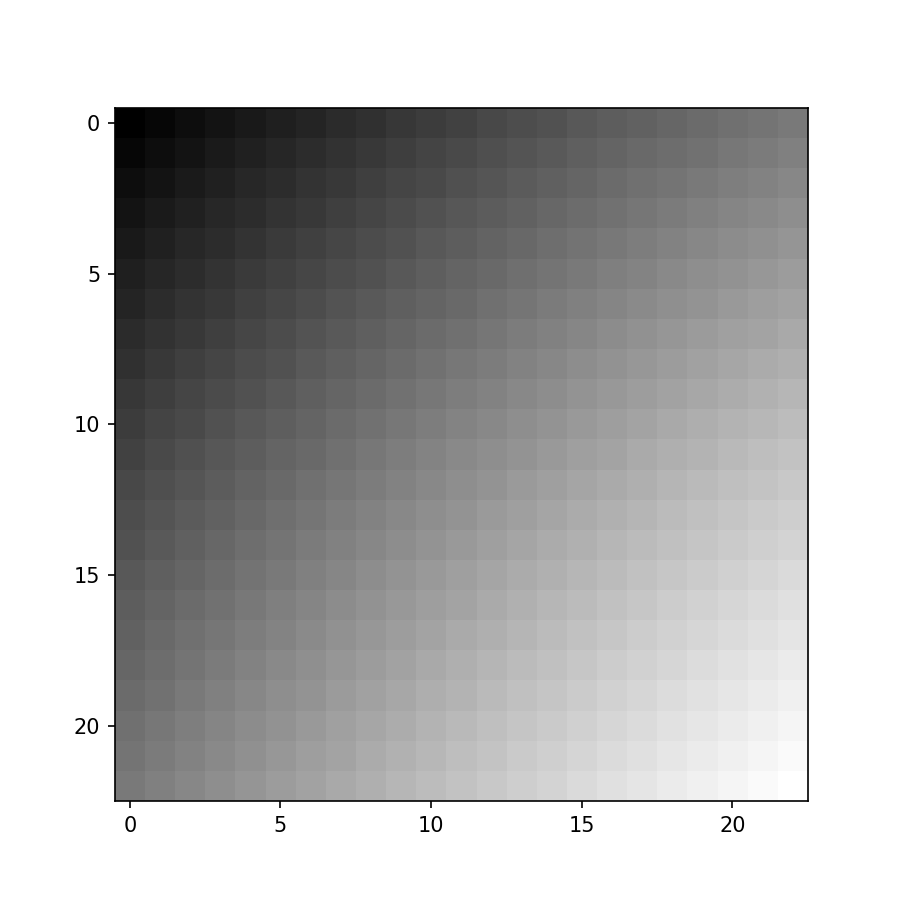

La transformée de fourier du signal échantillonné aprés reconstruction :



<IPython.core.display.Javascript object>


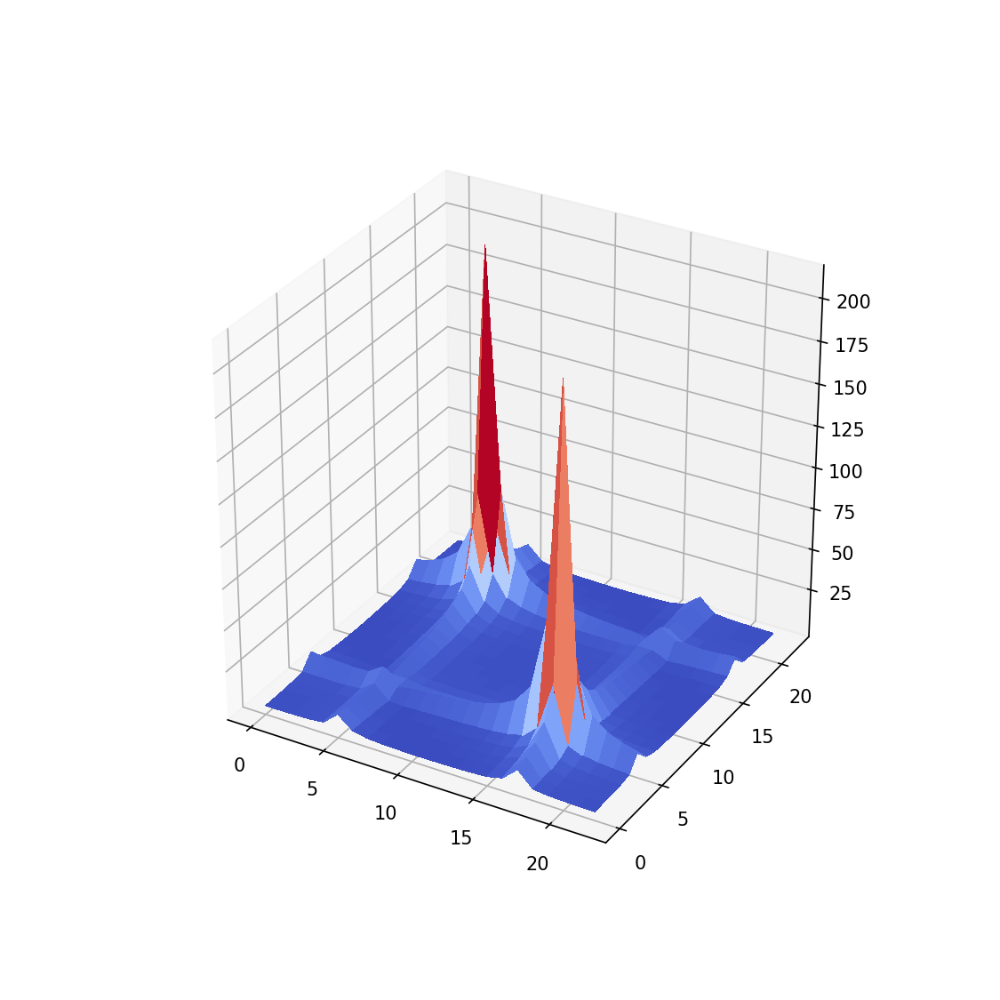

In [68]:
Fe=4*Fm

signalSampled=sinusoid2d(1,45,512,64,1/Fe) 

print("Le signal échantillonné :\n")
imshow(signalSampled)

print("Le signal échantillonné aprés reconstruction :\n")
imshow(shannonInterpolation(signalSampled,512,1/Fe))

print("La transformée de fourier du signal échantillonné aprés reconstruction :\n")
fourierSignal=fft2(signalSampled)
surf(toVisualizeFT(fourierSignal))

3. (b) Write a function `error()` implementing the relative average error $\displaystyle\epsilon_r = \frac 1{2AL^2}\sum_{k=0}^L\sum_{l=0}^L |x_r(k,l)-x_d(k,l)|$.

In [69]:
def error(Xr,Xd,A,L):
    return 1/(2*A*(L**2))*np.absolute(Xr-Xd).sum()
    

3. (c) Reconstruct the sampled signal. Display original and reconstructed signal.
   Print the relative average error between the original and reconstructed images. What is the origin of this error?

Le signal échantilloné :


<IPython.core.display.Javascript object>


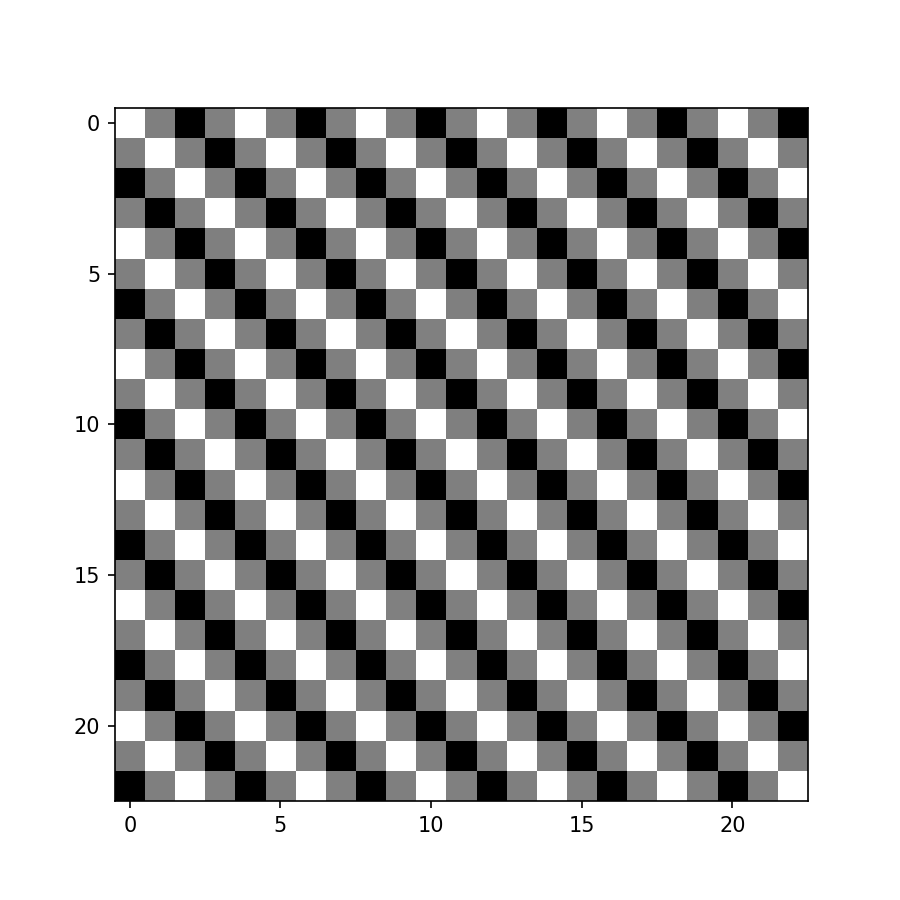

Le signal échantilloné reconstruit :


<IPython.core.display.Javascript object>


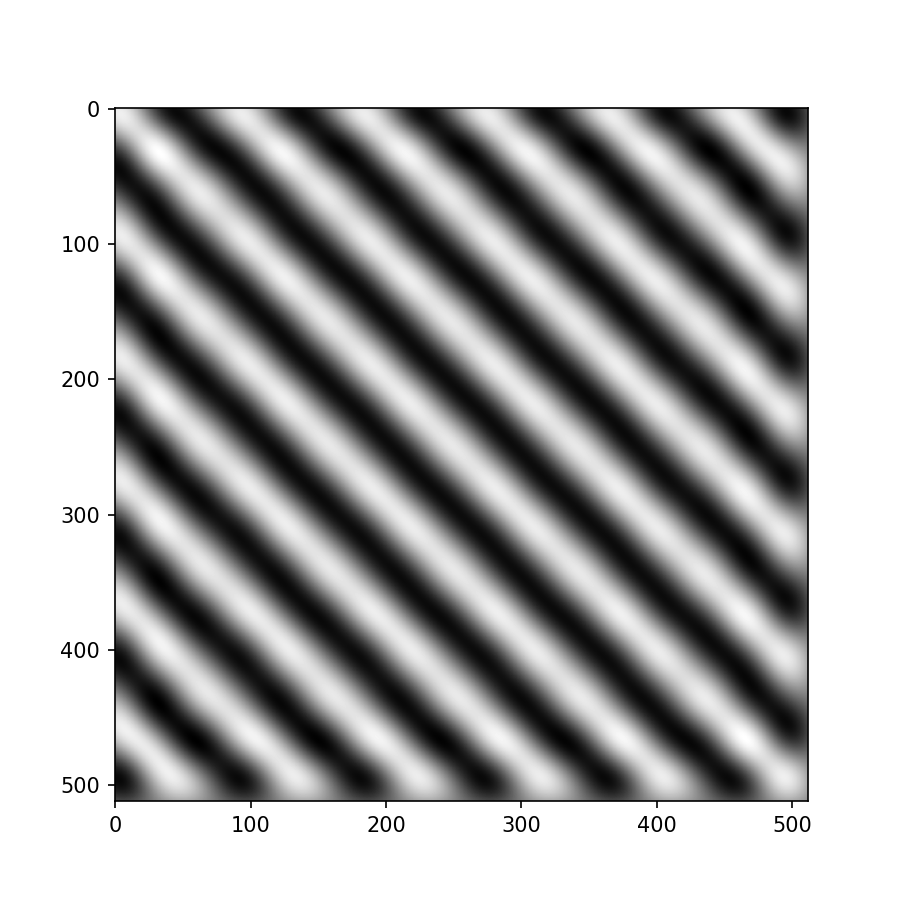

Le signal d'origine reconstruit :


<IPython.core.display.Javascript object>


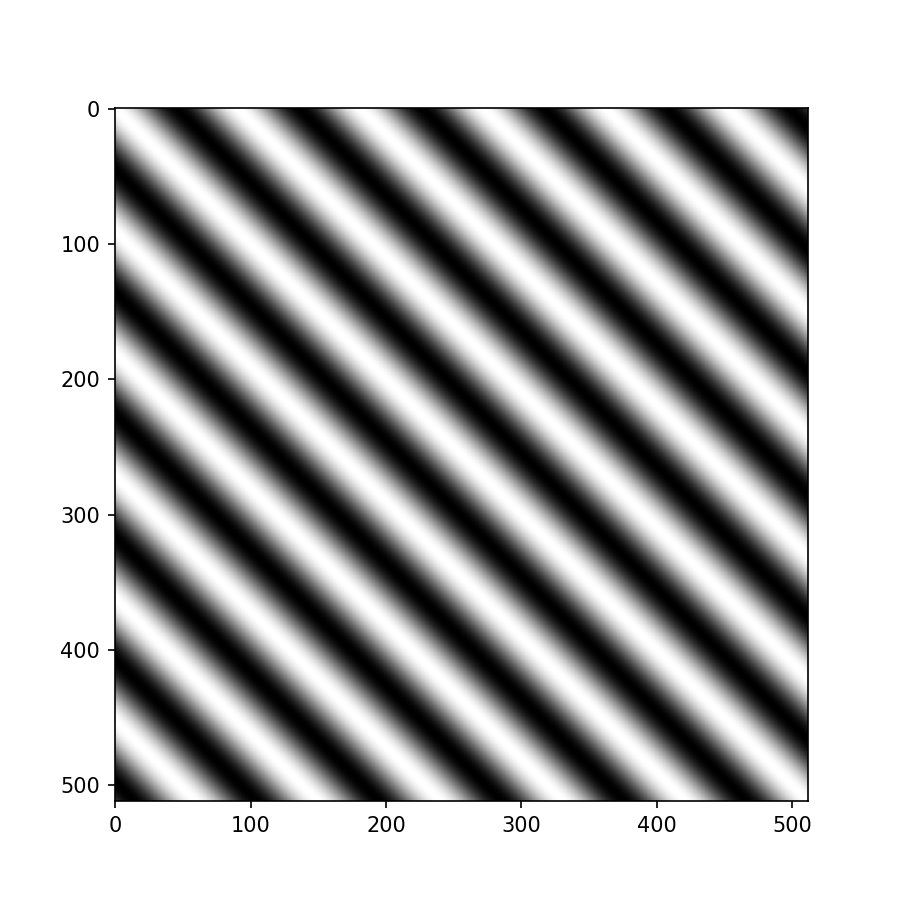

L'erreur entre le signal d'origine et le signal échantillonné reconstruit :



0.022936924082562756

In [70]:
Fe=4*Fm

signalSampled=sinusoid2d(1,45,512,64,1/Fe) 
print("Le signal échantilloné :")
imshow(signalSampled)

signalReconstructed=shannonInterpolation(signalSampled, 1/Fe, 512)
print("Le signal échantilloné reconstruit :")
imshow(signalReconstructed)

signalOrigin=sinusoid2d(1,45,512,64,1)
print("Le signal d'origine reconstruit :")
imshow(signalOrigin)

print("L'erreur entre le signal d'origine et le signal échantillonné reconstruit :\n")
error(signalOrigin,signalReconstructed,1,512)


4. Same question than 3. with $f_e = \frac32f_m$. Comment the effects of aliasing.

Le signal échantilloné :


<IPython.core.display.Javascript object>


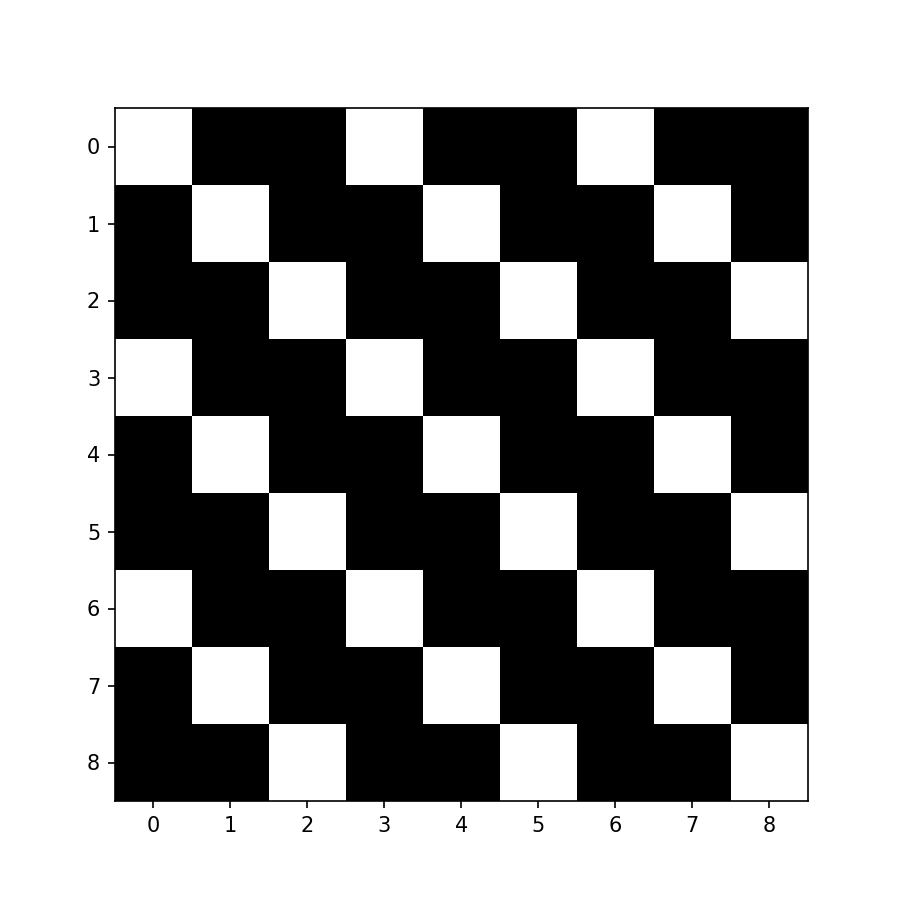

Le signal échantilloné reconstruit :


<IPython.core.display.Javascript object>


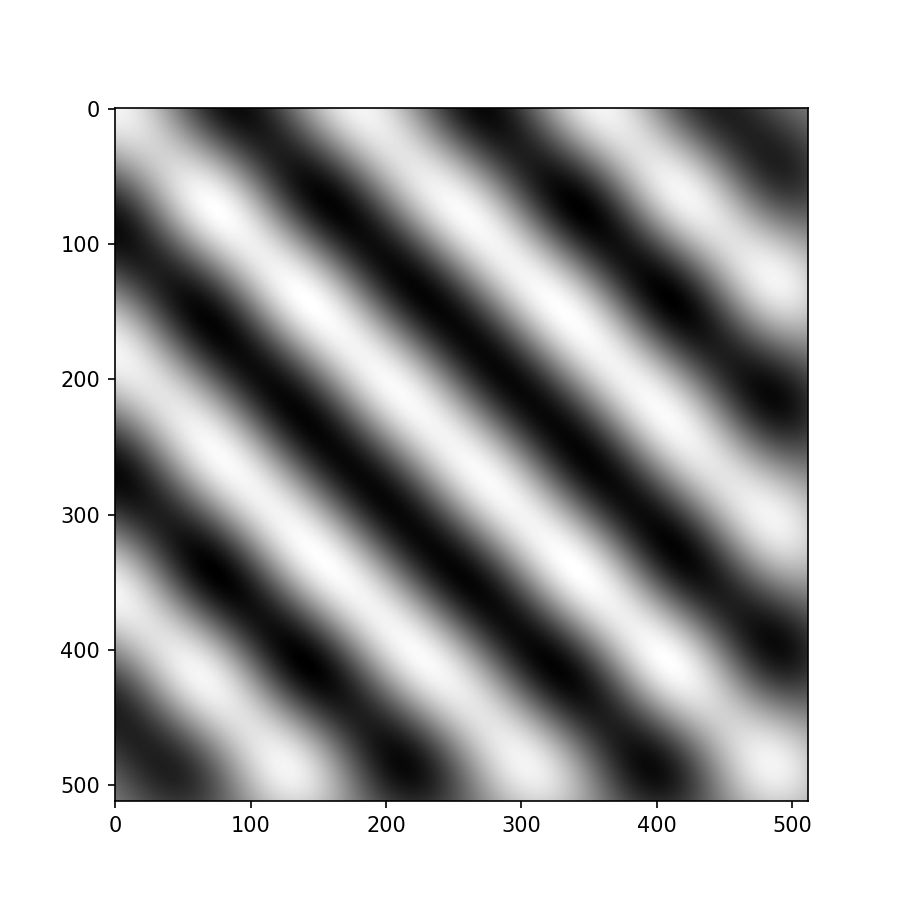

Le signal d'origine reconstruit :


<IPython.core.display.Javascript object>


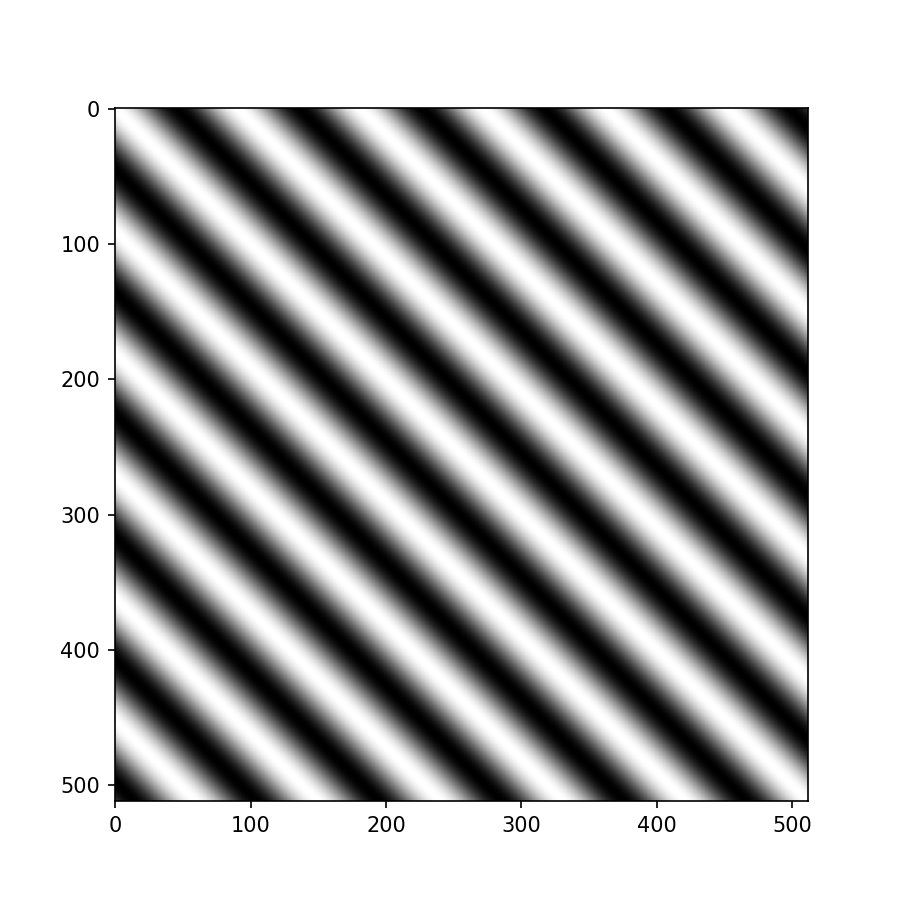

L'erreur entre le signal d'origine et le signal échantillonné reconstruit :



0.40686264767452424

In [71]:
Fe=3/2*Fm

signalSampled=sinusoid2d(1,45,512,64,1/Fe) 
print("Le signal échantilloné :")
imshow(signalSampled)

signalReconstructed=shannonInterpolation(signalSampled, 1/Fe, 512)
print("Le signal échantilloné reconstruit :")
imshow(signalReconstructed)

signalOrigin=shannonInterpolation(sinusoid2d(1,45,512,64,1),1,512)
print("Le signal d'origine reconstruit :")
imshow(signalOrigin)

print("L'erreur entre le signal d'origine et le signal échantillonné reconstruit :\n")
error(signalOrigin,signalReconstructed,1,512)

5. Consider the continuous signal with an oriention of $\theta=10°$. What is the value of $f_m$? With a sampling of $\frac32 f_e$ what is the additional drawback appearing after the reconstruction? Explain.

Le signal échantilloné reconstruit :


<IPython.core.display.Javascript object>


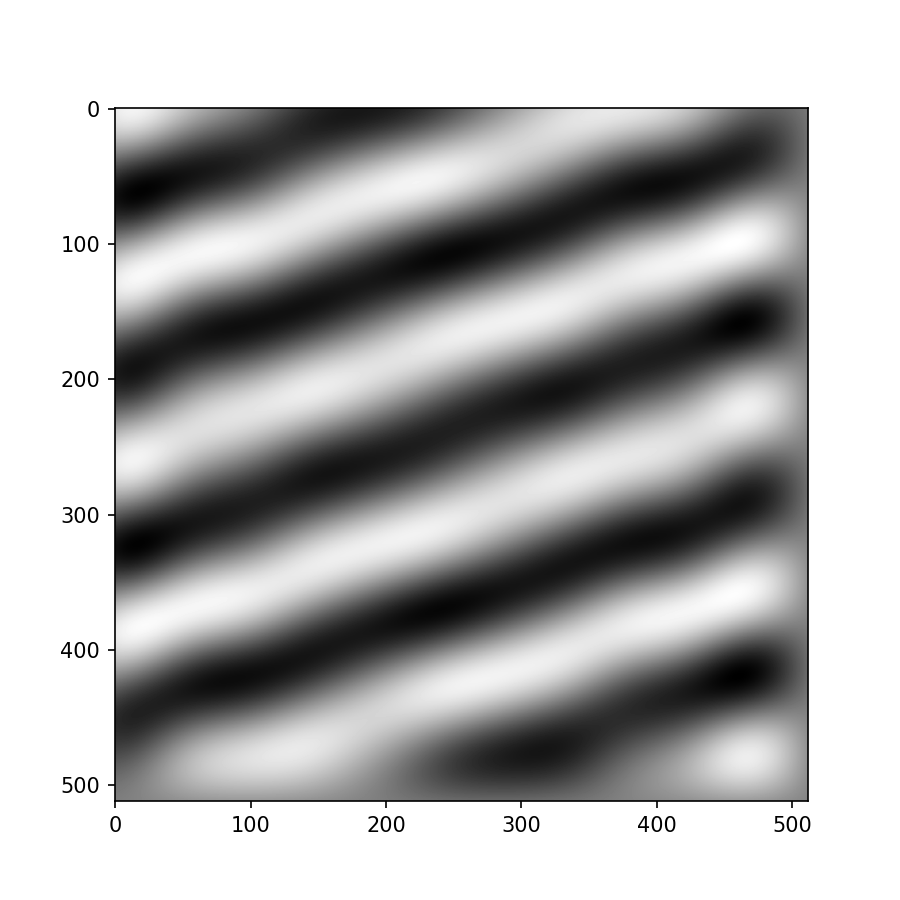

Le signal d'origine reconstruit :


<IPython.core.display.Javascript object>


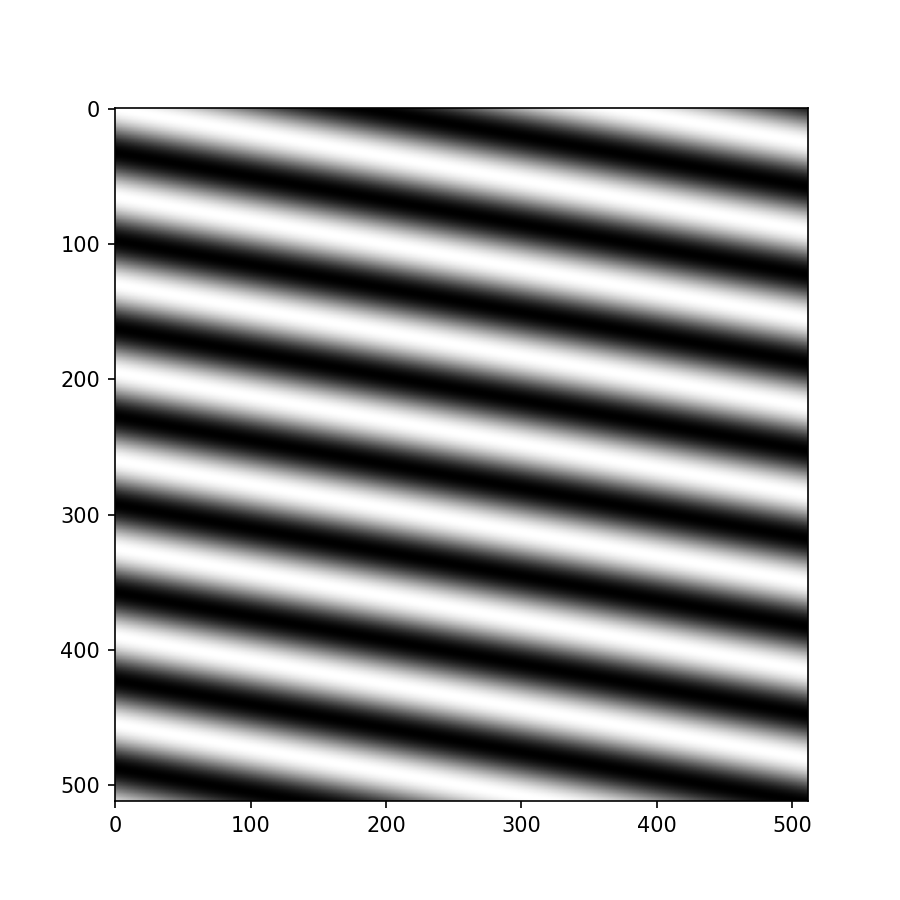

L'erreur entre le signal d'origine et le signal échantillonné reconstruit :



0.3982390760788183

In [72]:
Fmax=0.015387621
Fe=3/2*Fmax
signalS10=sinusoid2d(1,10,512,64,1) 
signalSampled=sinusoid2d(1,10,512,64,1/Fe)

signalReconstructed=shannonInterpolation(signalSampled, 1/Fe, 512)
print("Le signal échantilloné reconstruit :")
imshow(signalReconstructed)

signalOrigin=shannonInterpolation(sinusoid2d(1,10,512,64,1),1,512)
print("Le signal d'origine reconstruit :")
imshow(signalOrigin)

print("L'erreur entre le signal d'origine et le signal échantillonné reconstruit :\n")
error(signalOrigin,signalReconstructed,1,512)


6. Bonus question: write a function `shannonInterpolationLoop()` implementing equation (1) using two loops, in a C way. Compare and discuss the run time of this function and  `shannonInterpolation()` on a small signal ($L=64$). Runtime can be measured using `tic()` and `tac()` functions.

In [1]:
from time import process_time
mytime = 0
def tic():
    """ NoneType -> NoneType """
    global mytime
    mytime = process_time()
def tac():
    """ NoneType -> int """
    global mytime
    print (process_time()-mytime)
    mytime = process_time()

### your code starts below



## Exercice 2: aliasing on natural images

In this exercice, we study aliasing on image `img/barbara.png`. Aliasing occurring with subsample of image, we propose to write a code that implements a subsample (using function `subSample2()` of factor 2 on the image.  

In [73]:
from PIL import Image

barbara = np.array(Image.open('img/barbara.png'))

def subSample2(I):
    """ Array -> Array """
    return I[::2,::2]

1. Explain what is a subsample of factor 2 and the impact when applied on an image. 

-Le sous échantillonnage avec un facteur de 2, c'est de prendre des points espacés les uns des autres de 2 points chacun, ou bien autrement dit prendre une ligne sur 2 et une colonne sur 2.
-Appliquer le sous échantillonnage de facteur 2 revient à prendre chaque valeur de de la matrice image qui à une distance d'un point échantilloné = 2 en partant du point(0,0), ce qui diminura la résolution de l'image échantillonée à (n/2)*(m/2)
avec n le nombre de lignes et m le nombre de colonnes. Et il y aura une perte d'information, les détails seront moins claires, on aura un effet d'aliasing. 

2. Write a code that
 - iterates the subsampling process
 - at each iteration, computes the Fourier transform of the subsampled image

   Display subsampled images and their spectrum. Describe and interpret the effects of aliasing. Why aliasing is a drawback ?

<IPython.core.display.Javascript object>


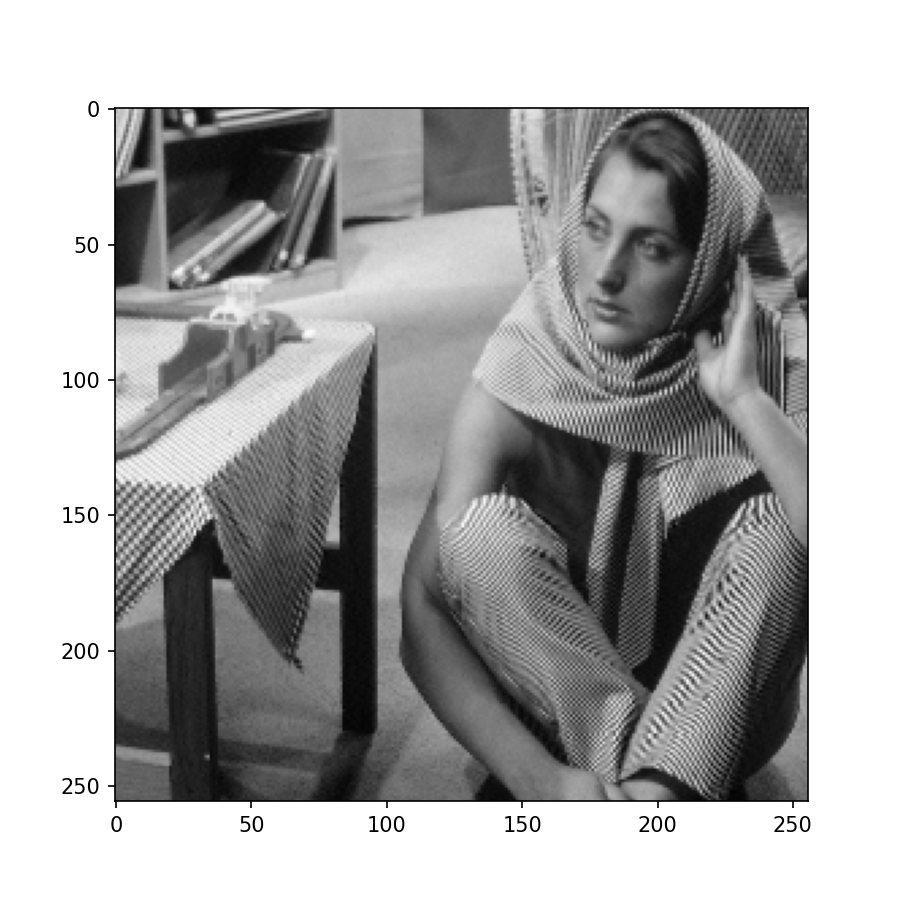

<IPython.core.display.Javascript object>


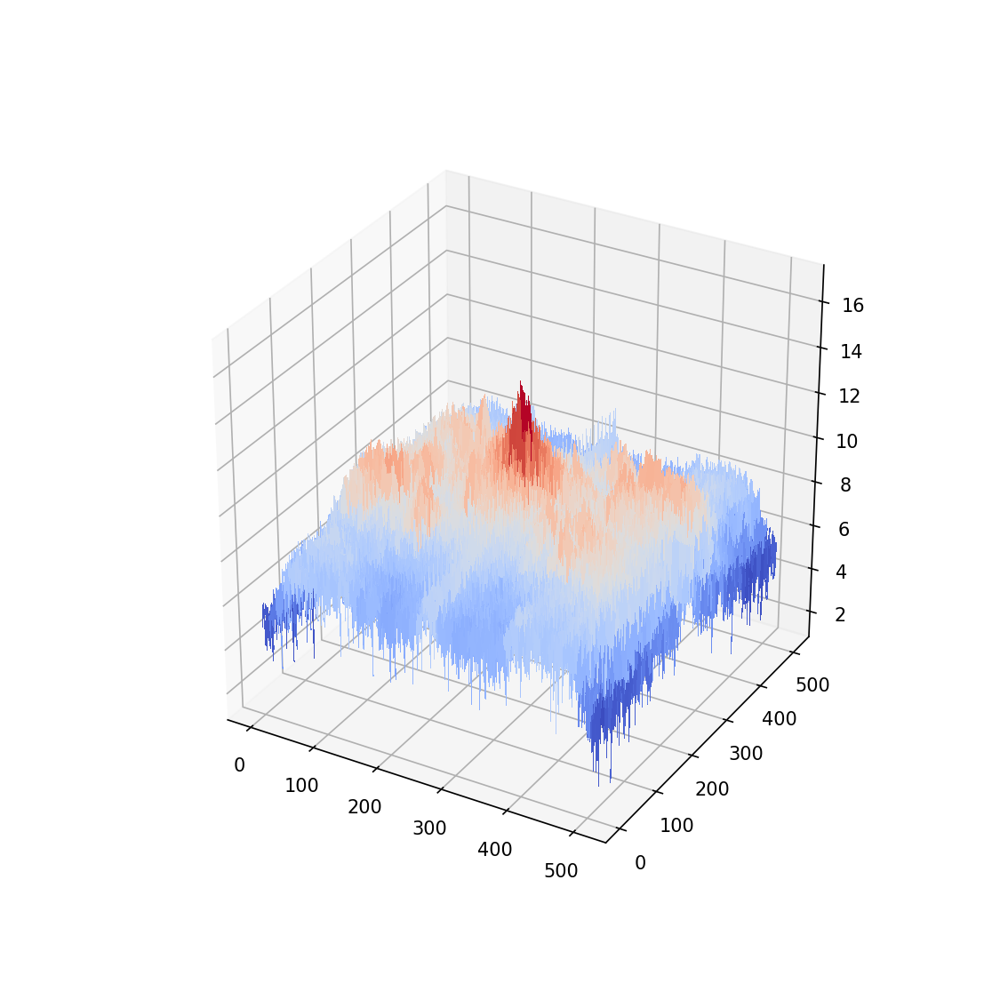

<IPython.core.display.Javascript object>


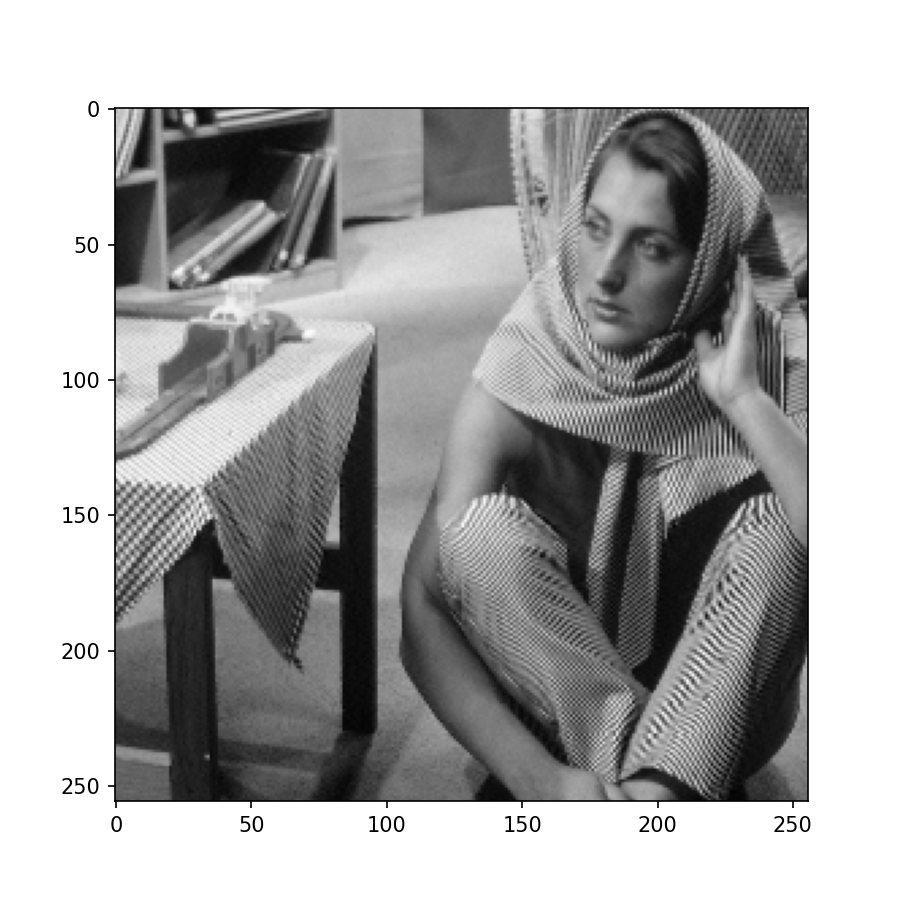

<ipython-input-63-3908de25c9ac>:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(600/80,600/80))


<IPython.core.display.Javascript object>


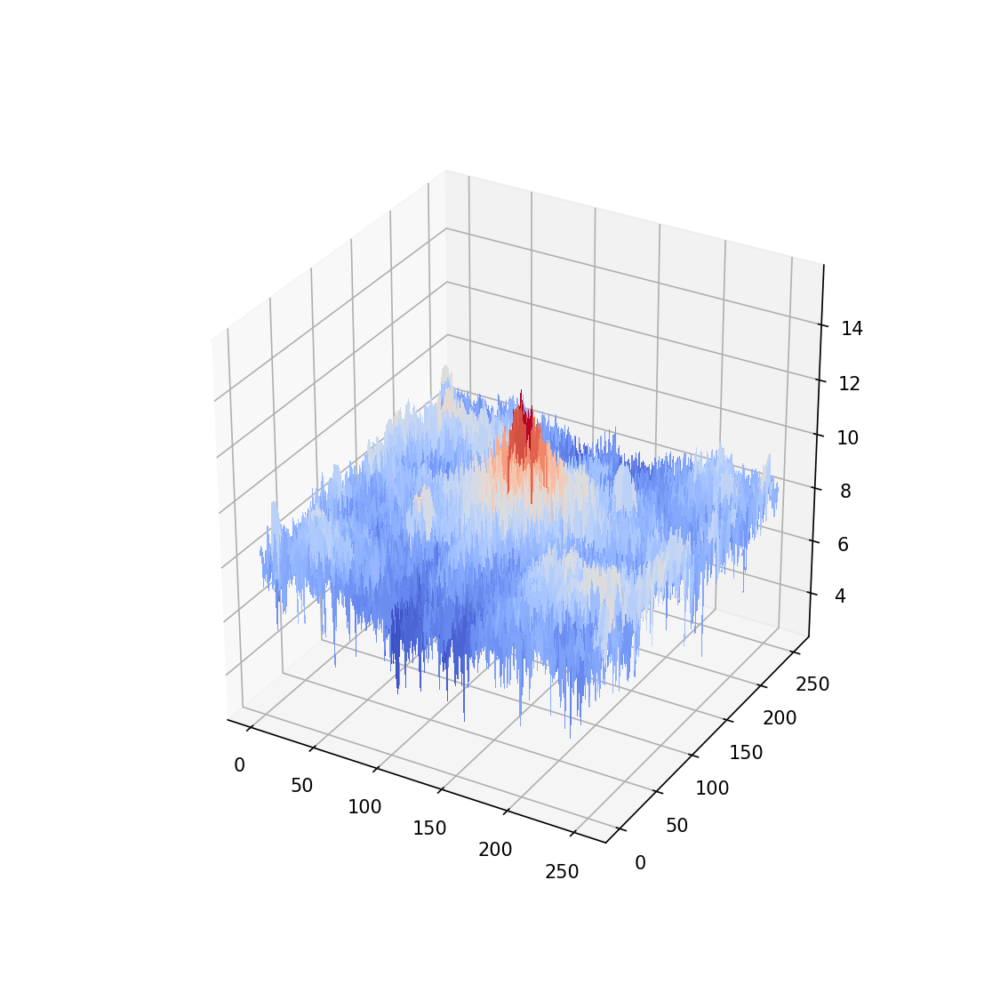

<ipython-input-63-3908de25c9ac>:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(500//80,500//80))


<IPython.core.display.Javascript object>


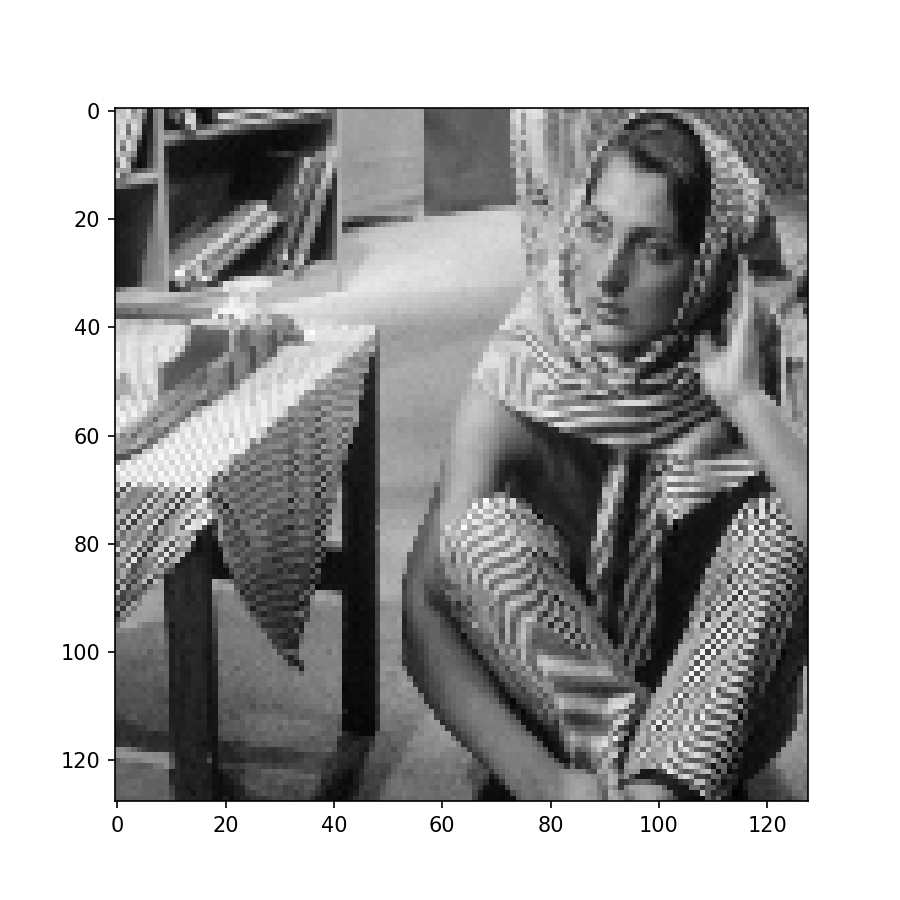

<IPython.core.display.Javascript object>


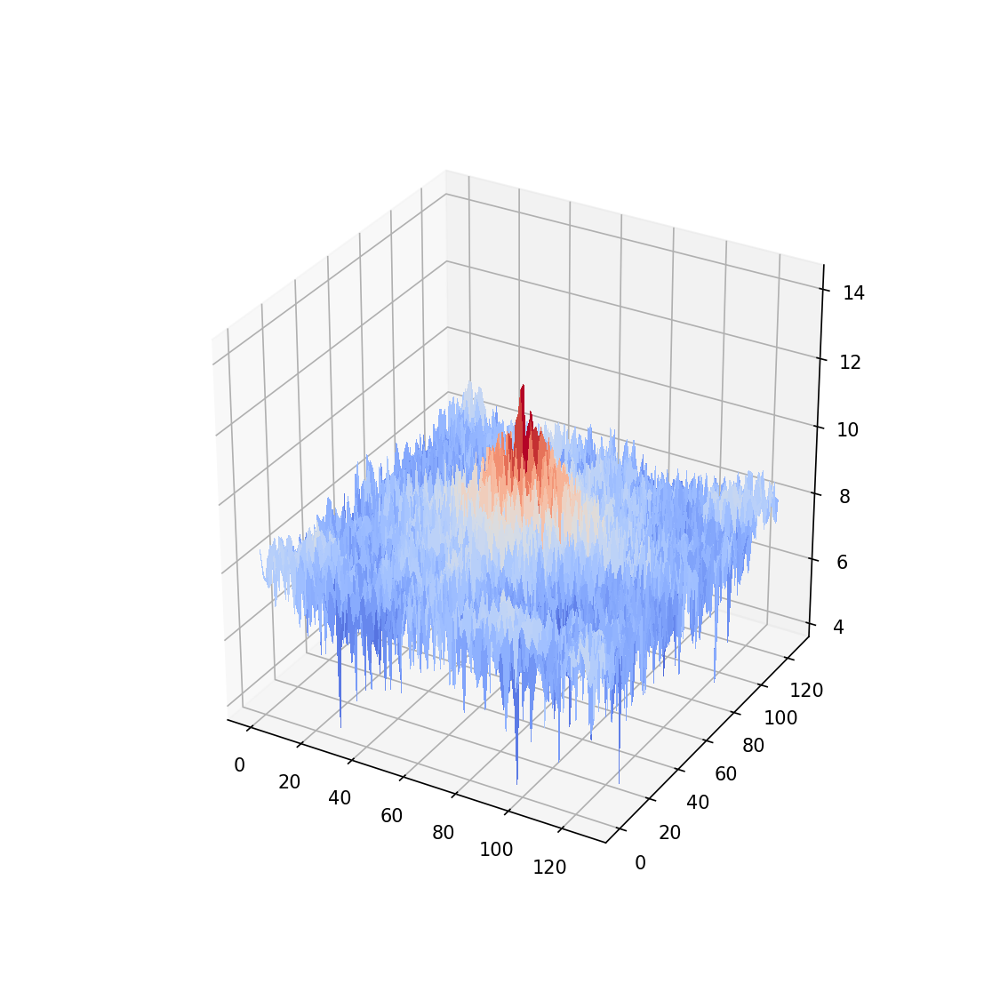

<IPython.core.display.Javascript object>


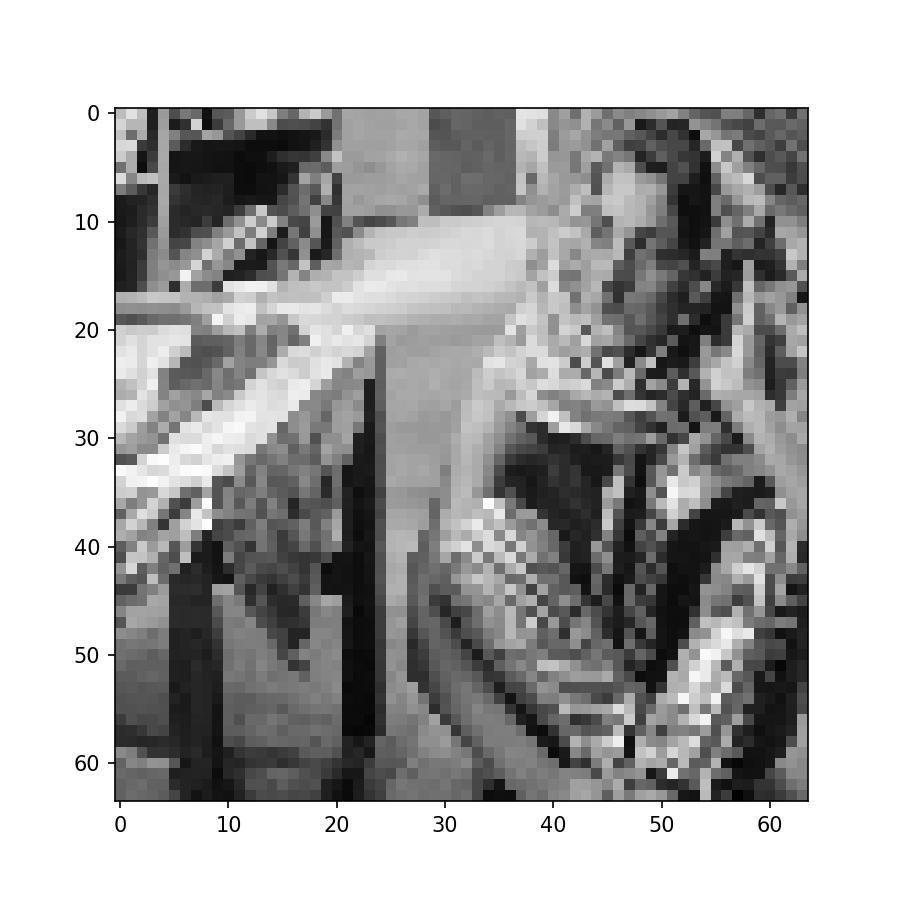

<IPython.core.display.Javascript object>


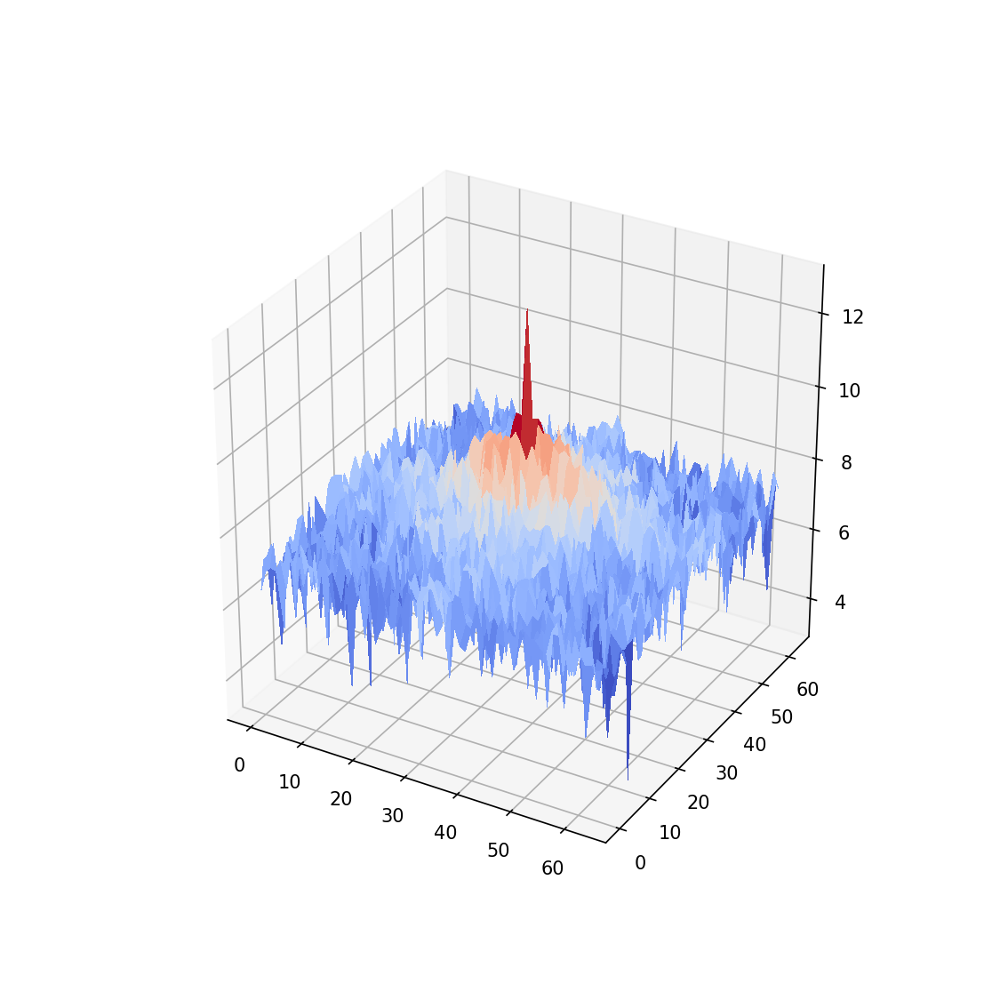

<IPython.core.display.Javascript object>


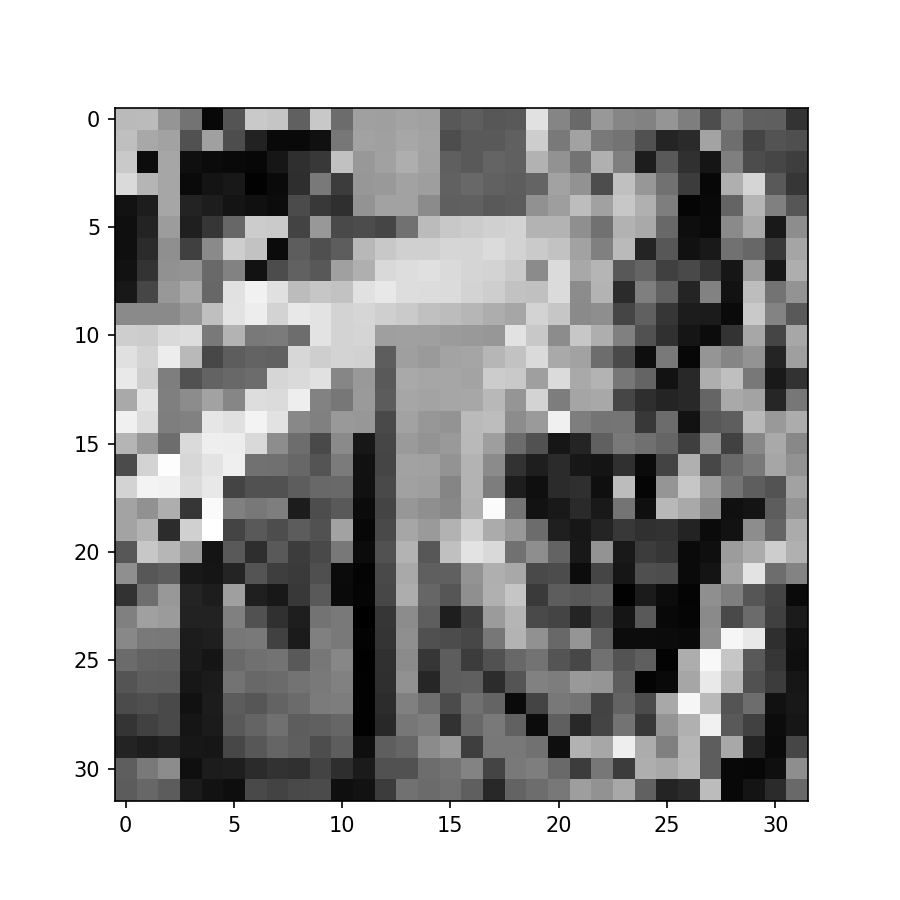

<IPython.core.display.Javascript object>


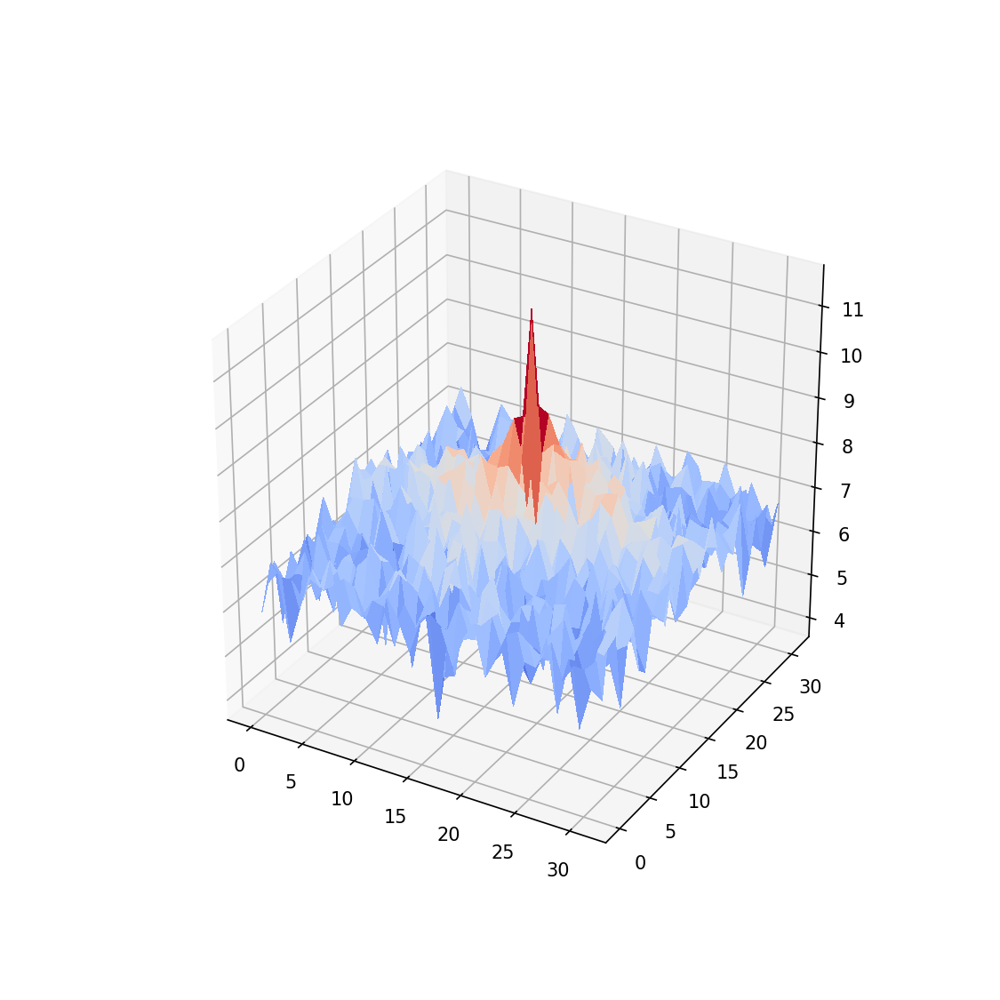

<IPython.core.display.Javascript object>


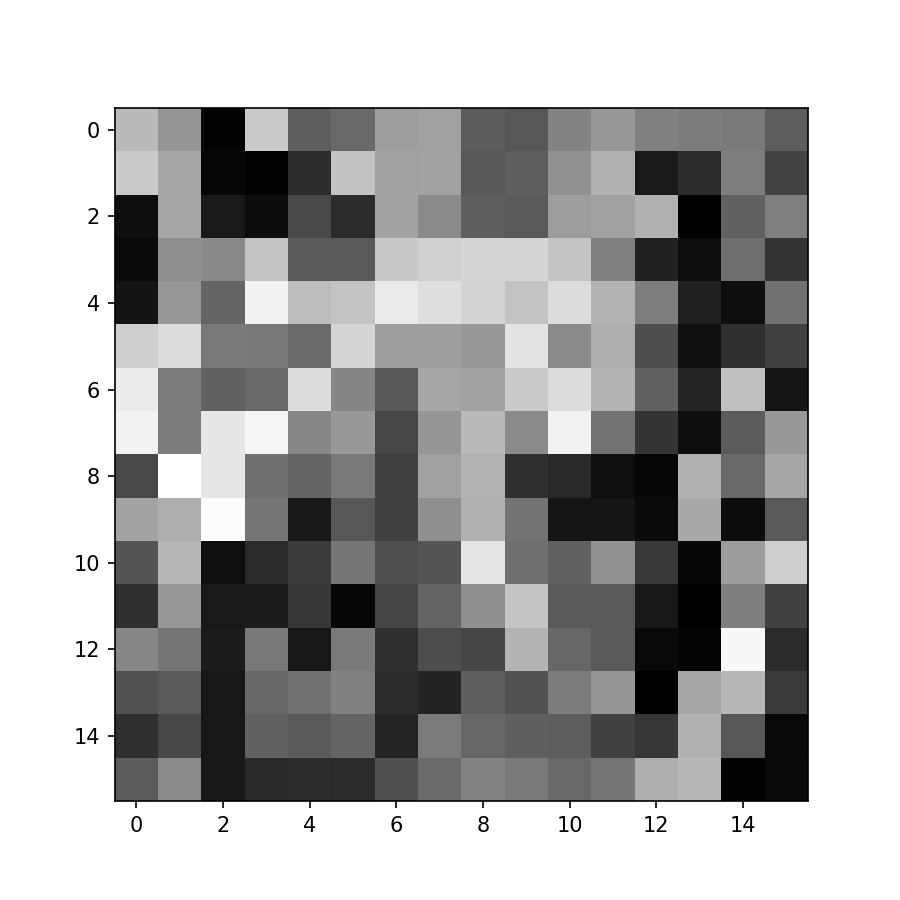

<IPython.core.display.Javascript object>


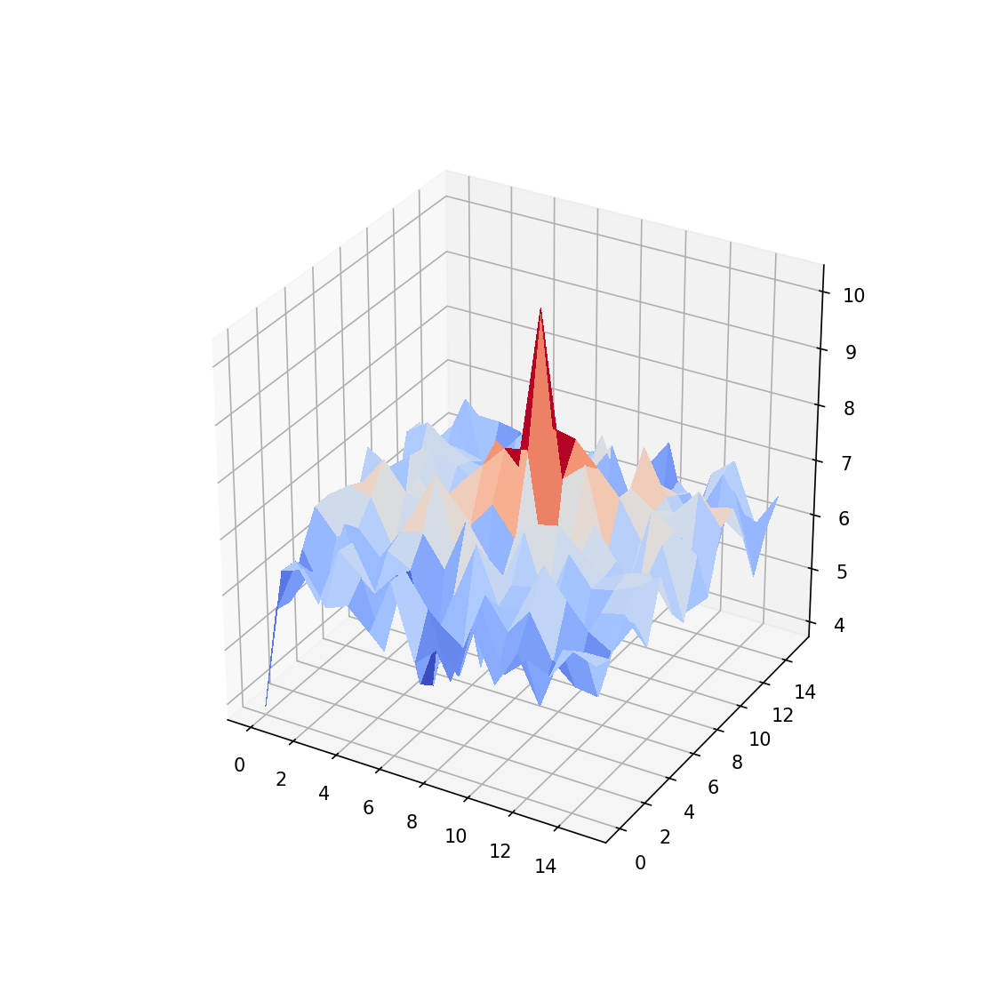

<IPython.core.display.Javascript object>


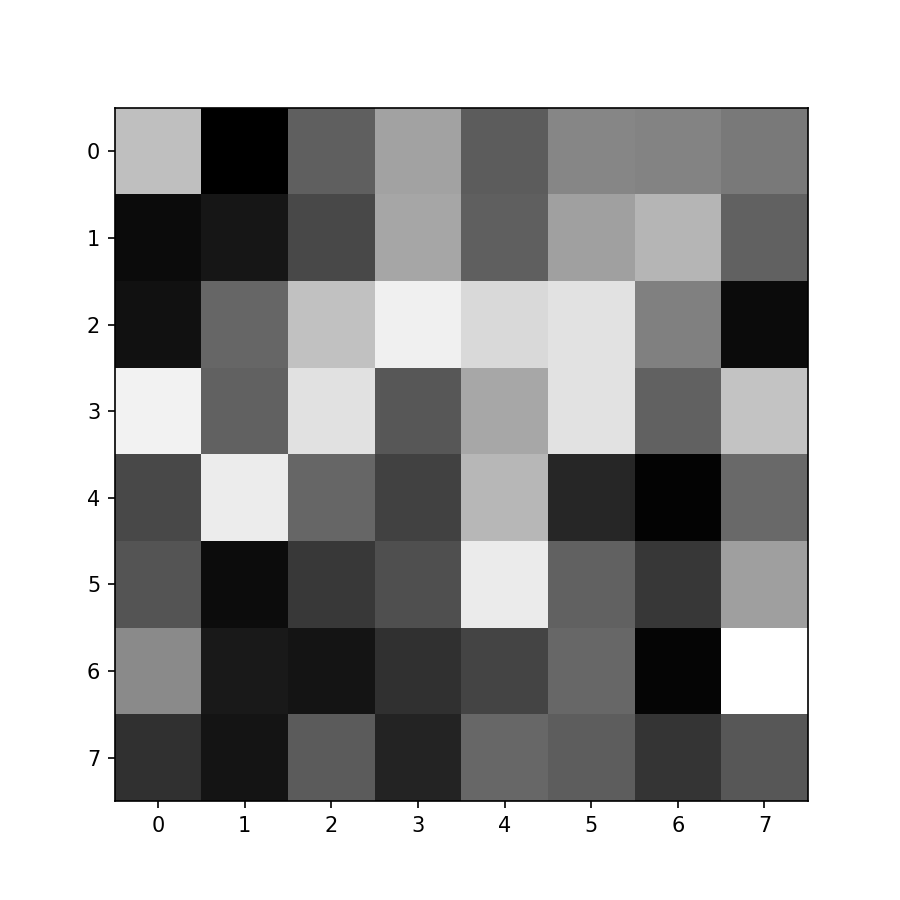

<IPython.core.display.Javascript object>


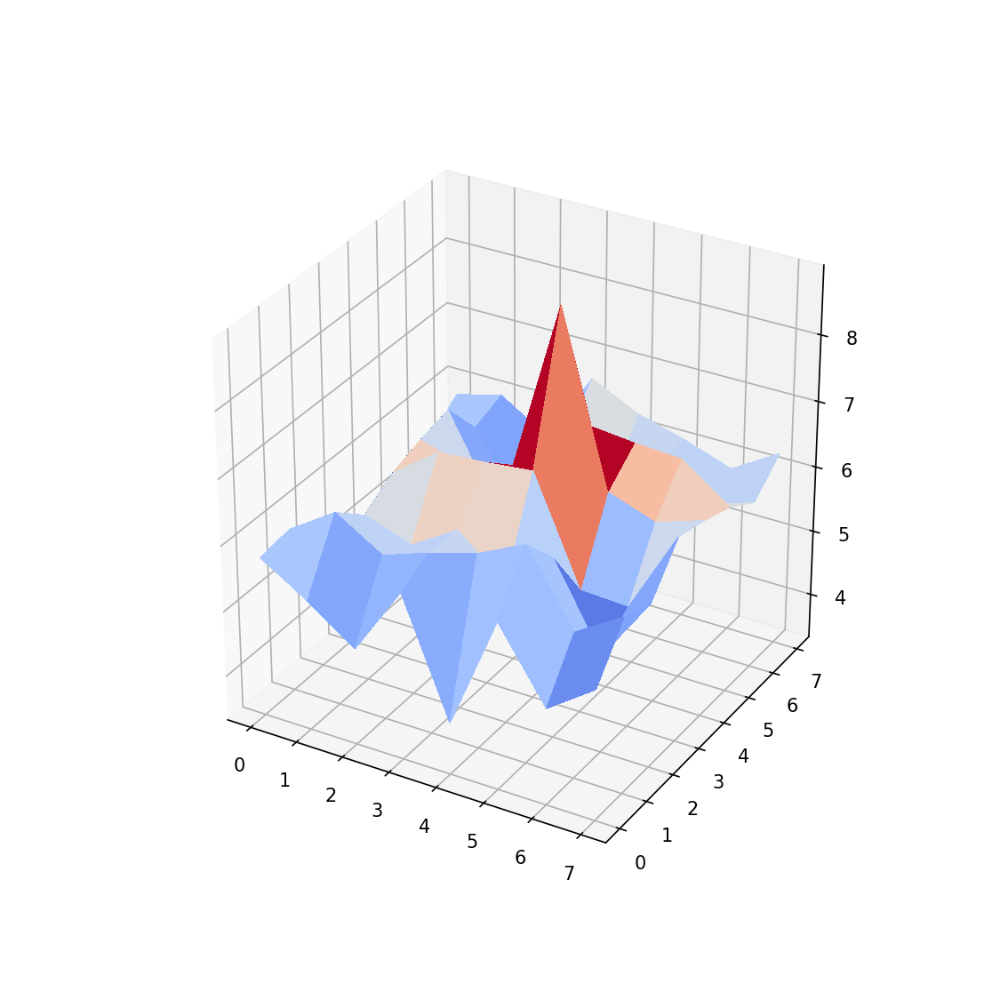

<IPython.core.display.Javascript object>


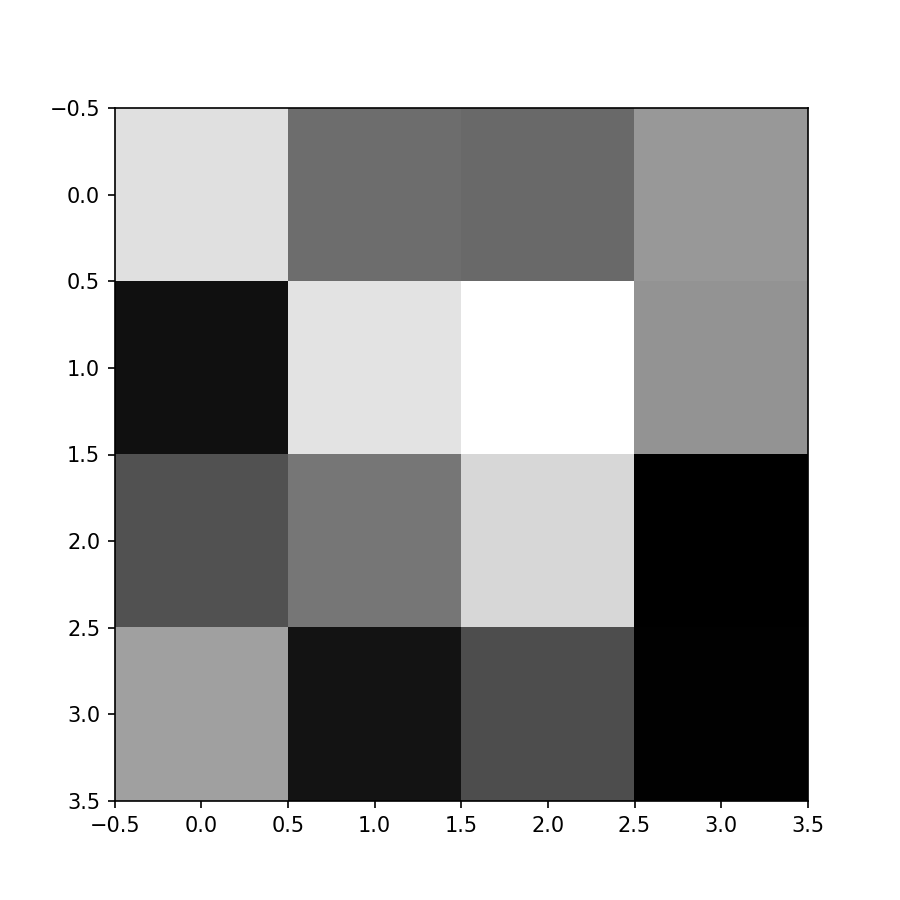

<IPython.core.display.Javascript object>


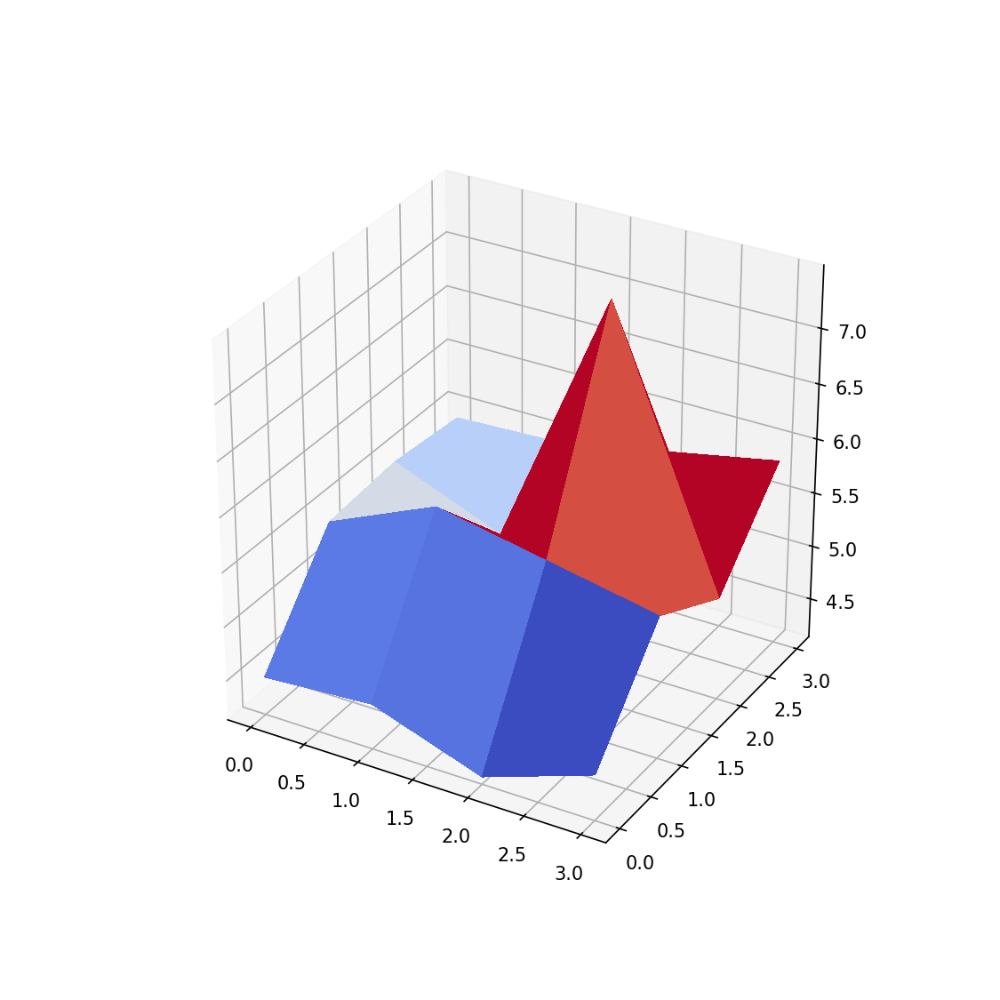

<IPython.core.display.Javascript object>


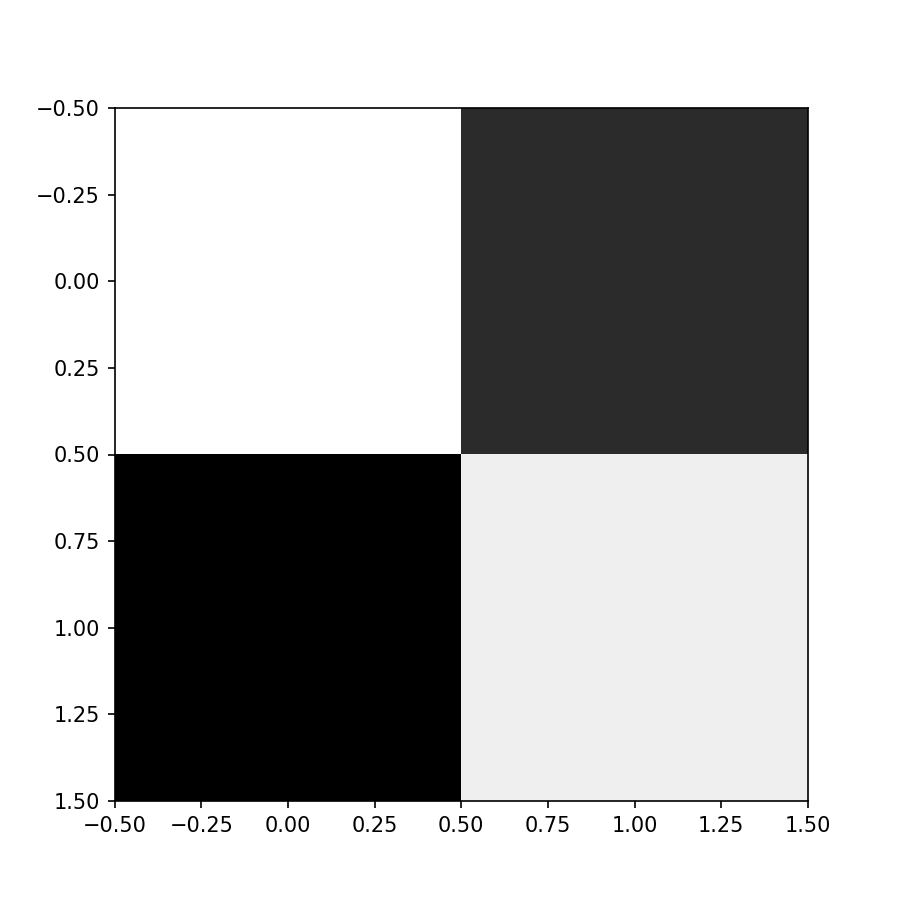

<IPython.core.display.Javascript object>


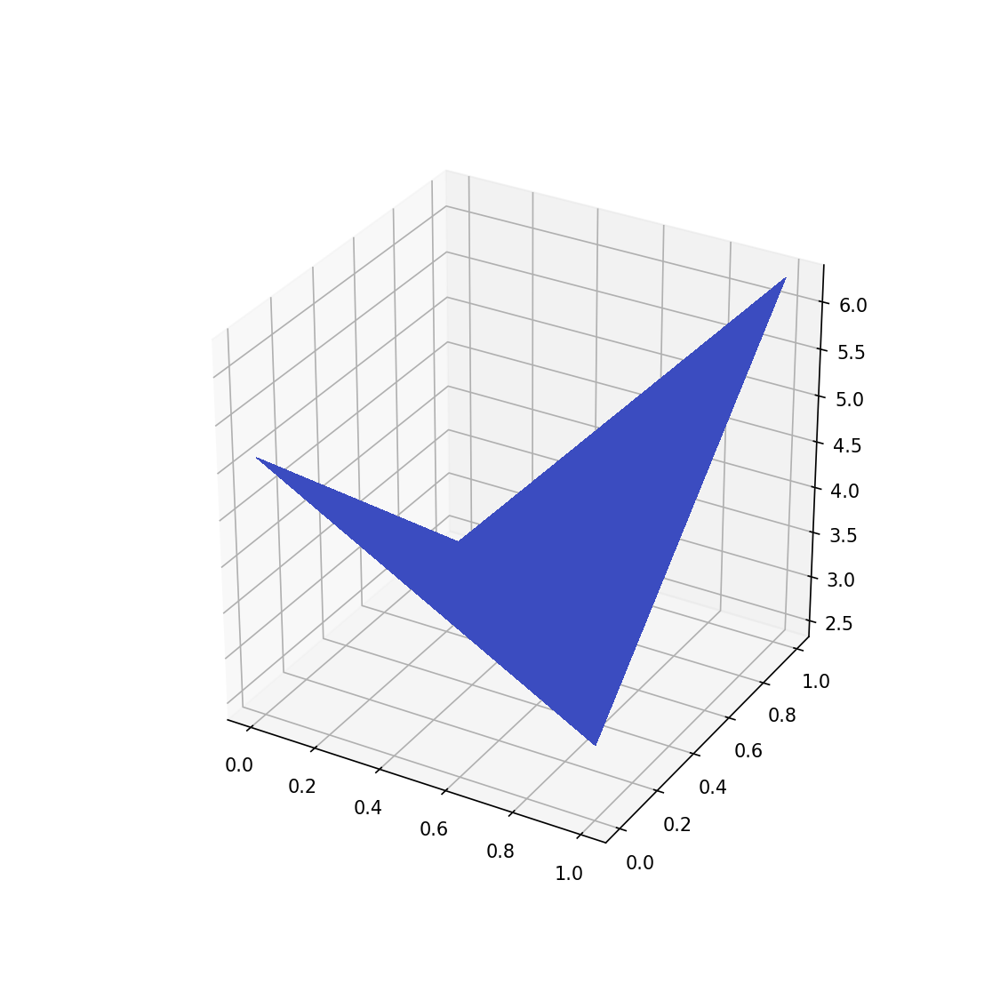

In [74]:
varBool=False
subSample=barbara
imshow(subSample2(barbara))
subSampleFT=fft2(subSample)
surf(toVisualizeLogFT(subSampleFT))


while(not varBool):
    subSample=subSample2(subSample)
    imshow(subSample)
    subSampleFT=fft2(subSample)
    surf(toVisualizeLogFT(subSampleFT))
    if(np.shape(subSample)[0]<=2 and np.shape(subSample)[0]<=2):
        varBool=True
      
        
        

3. Bonus question: same question with the image `img/mandrill.png`.

<ipython-input-63-3908de25c9ac>:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(500//80,500//80))


<IPython.core.display.Javascript object>


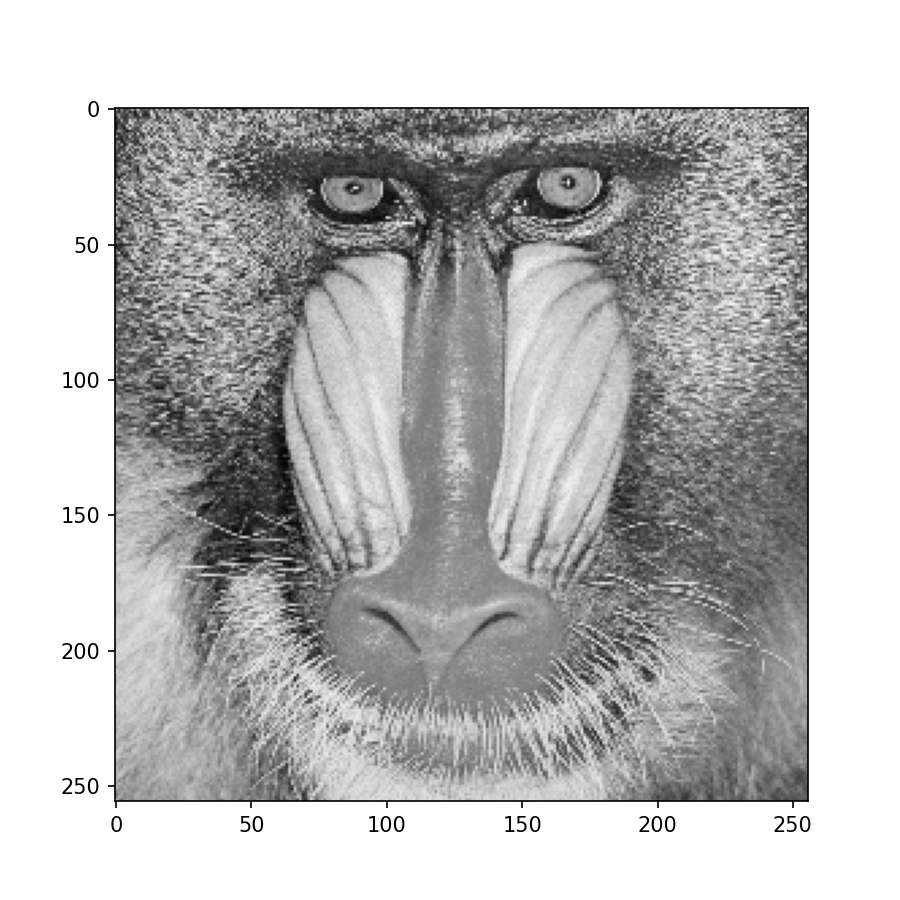

<ipython-input-63-3908de25c9ac>:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(600/80,600/80))


<IPython.core.display.Javascript object>


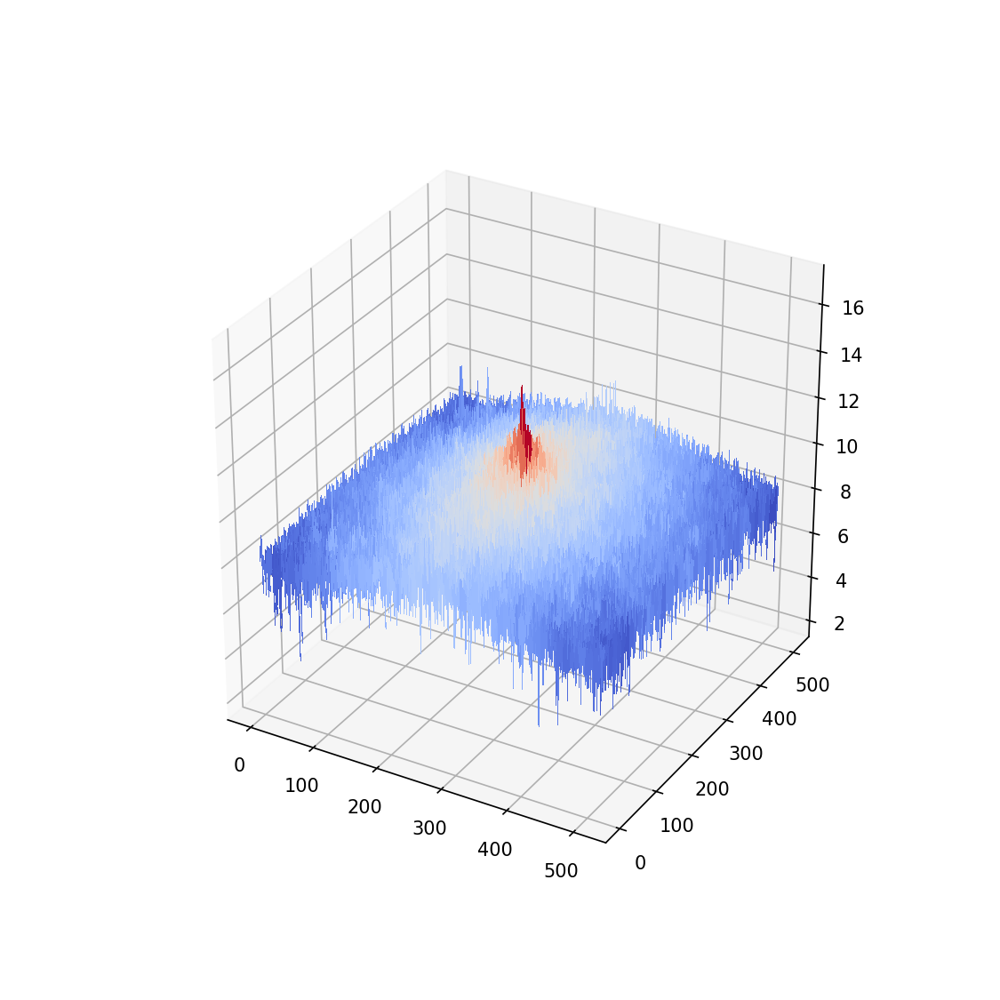

<IPython.core.display.Javascript object>


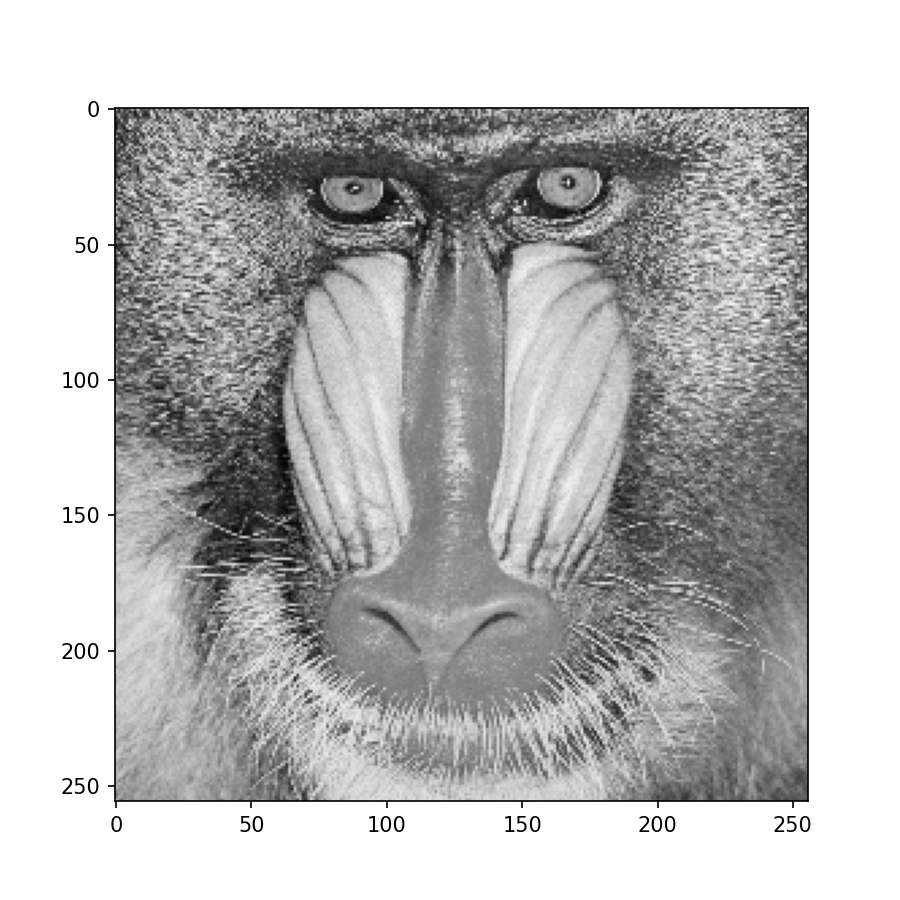

<IPython.core.display.Javascript object>


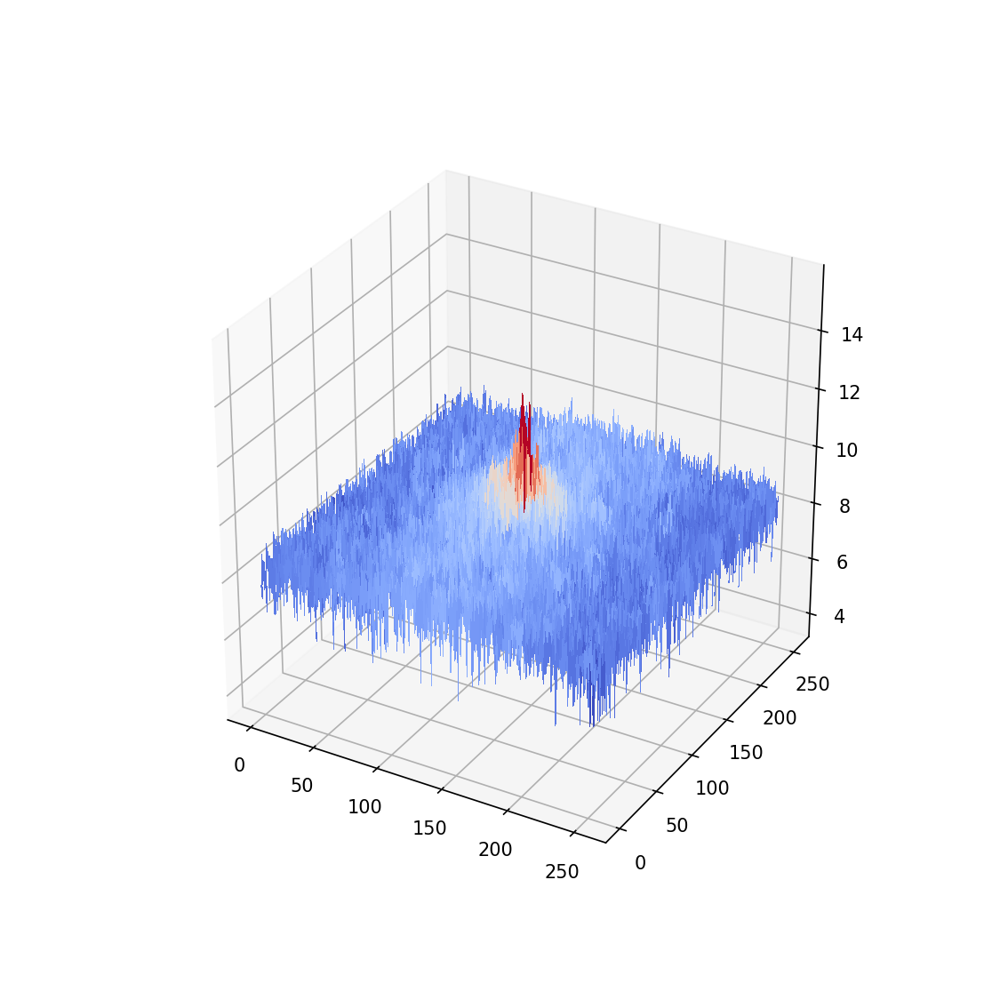

<IPython.core.display.Javascript object>


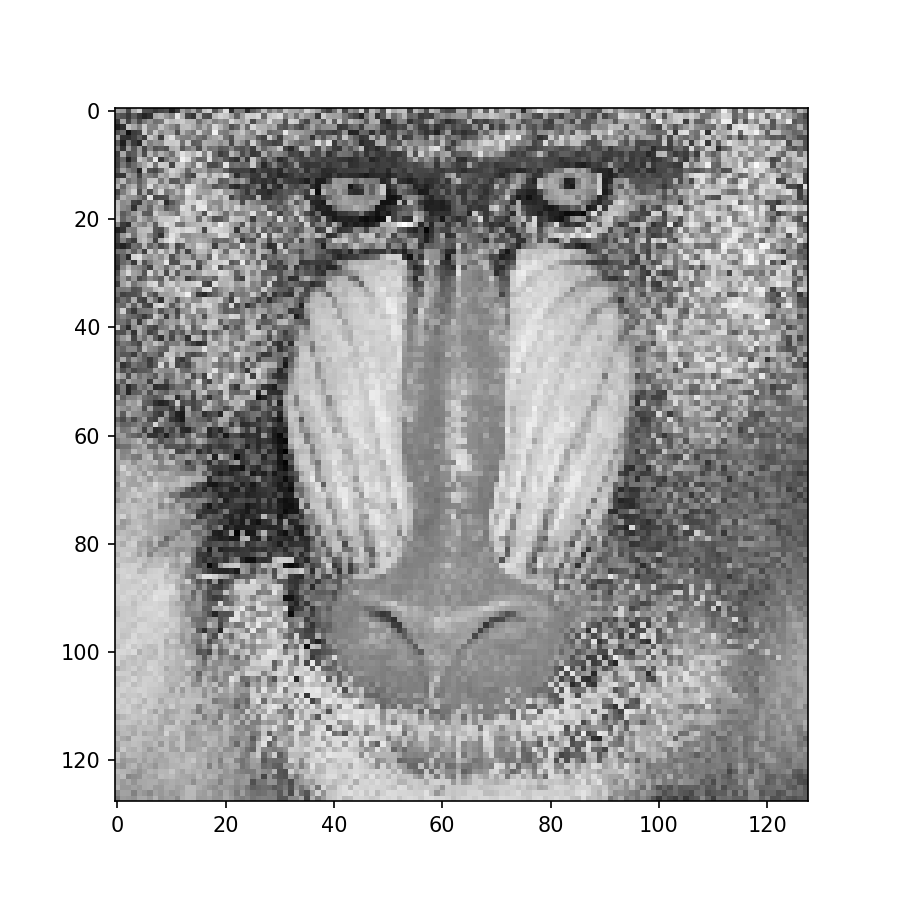

<IPython.core.display.Javascript object>


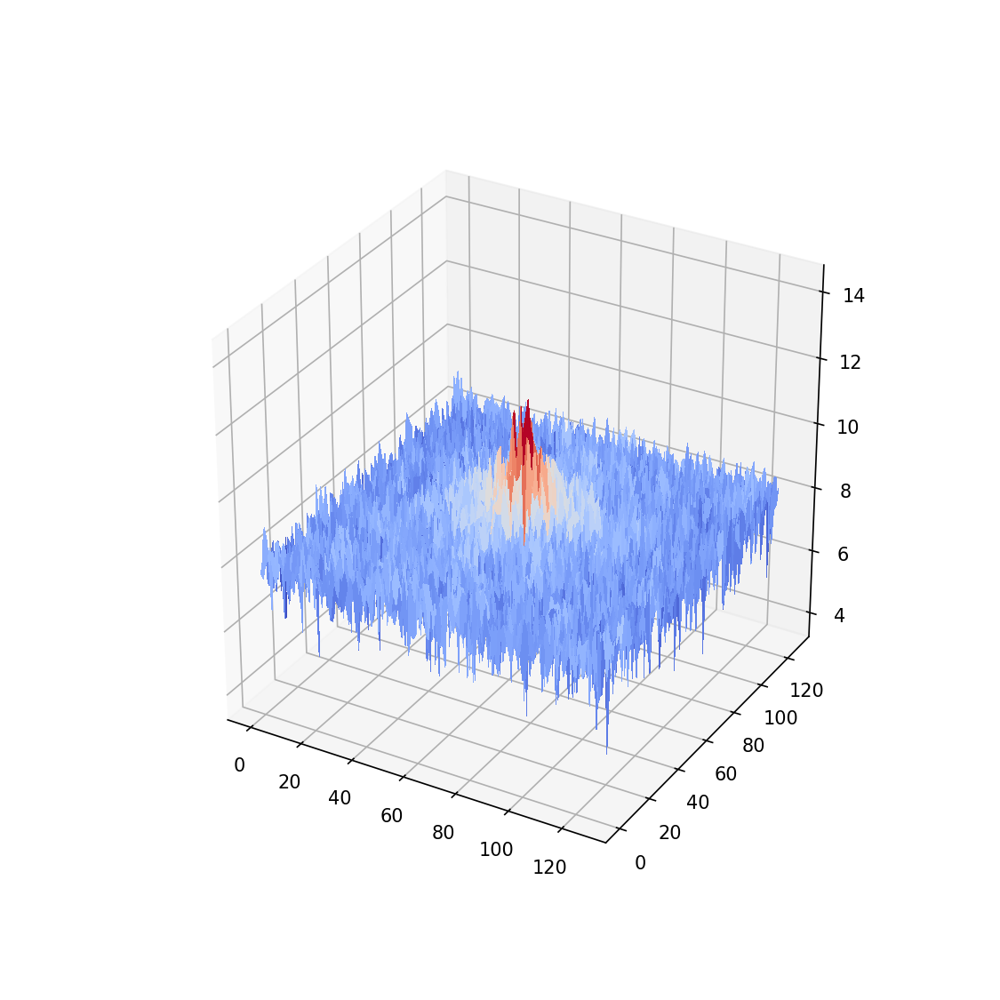

<IPython.core.display.Javascript object>


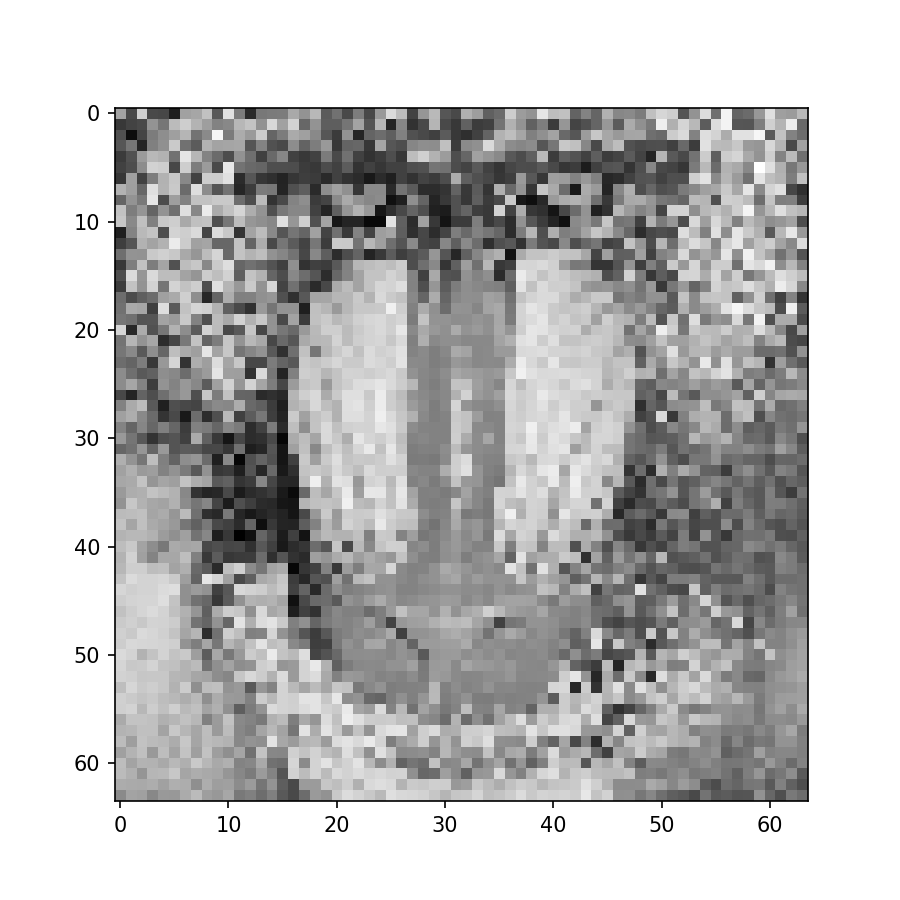

<IPython.core.display.Javascript object>


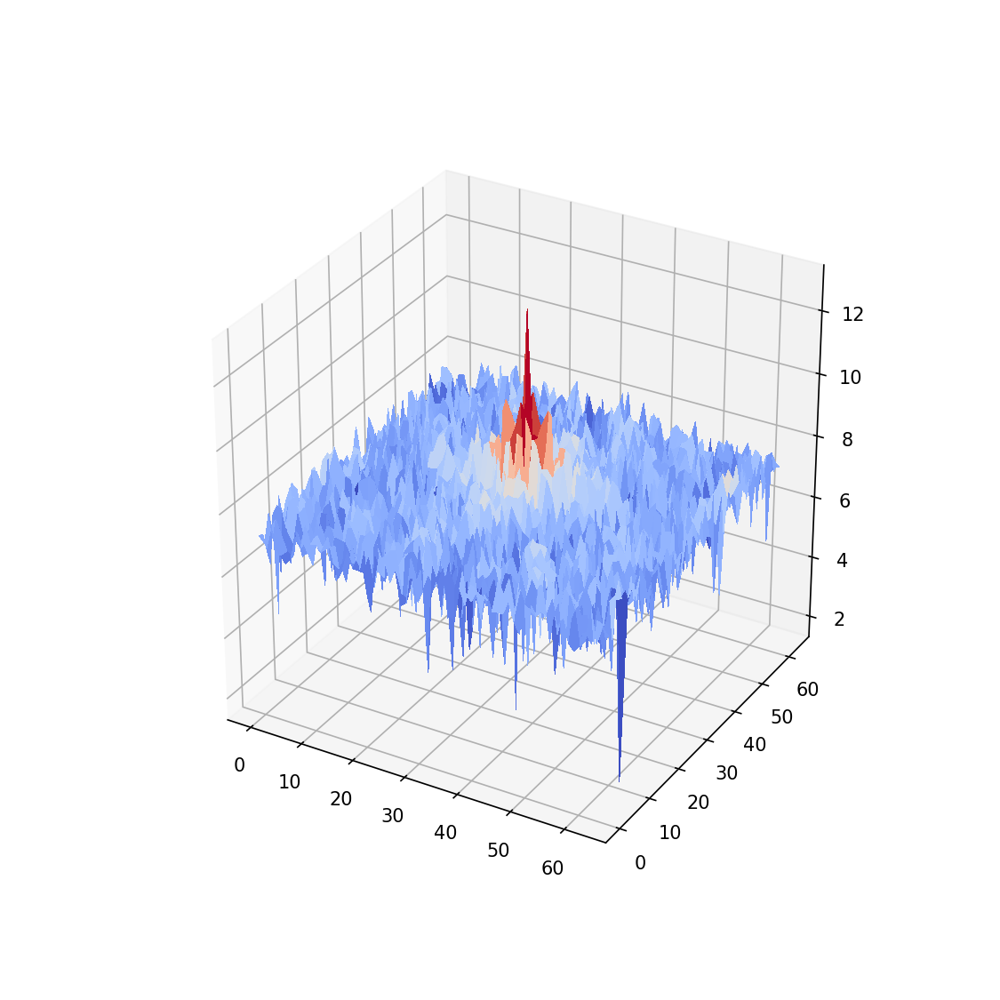

<IPython.core.display.Javascript object>


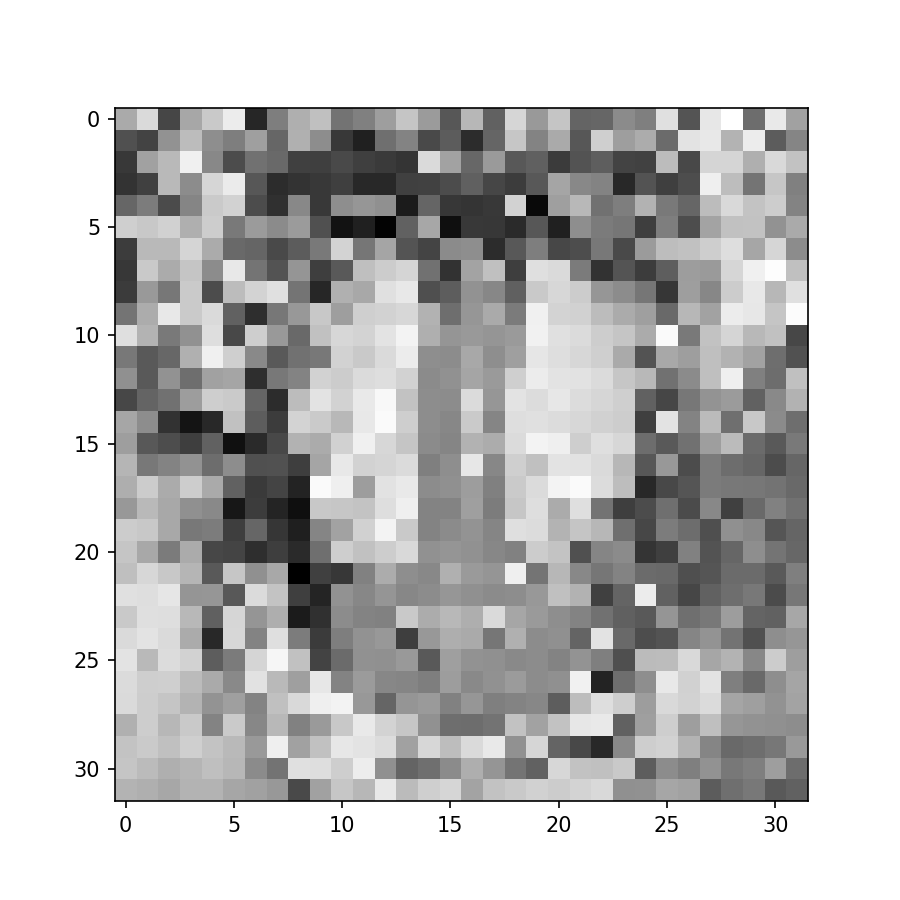

<IPython.core.display.Javascript object>


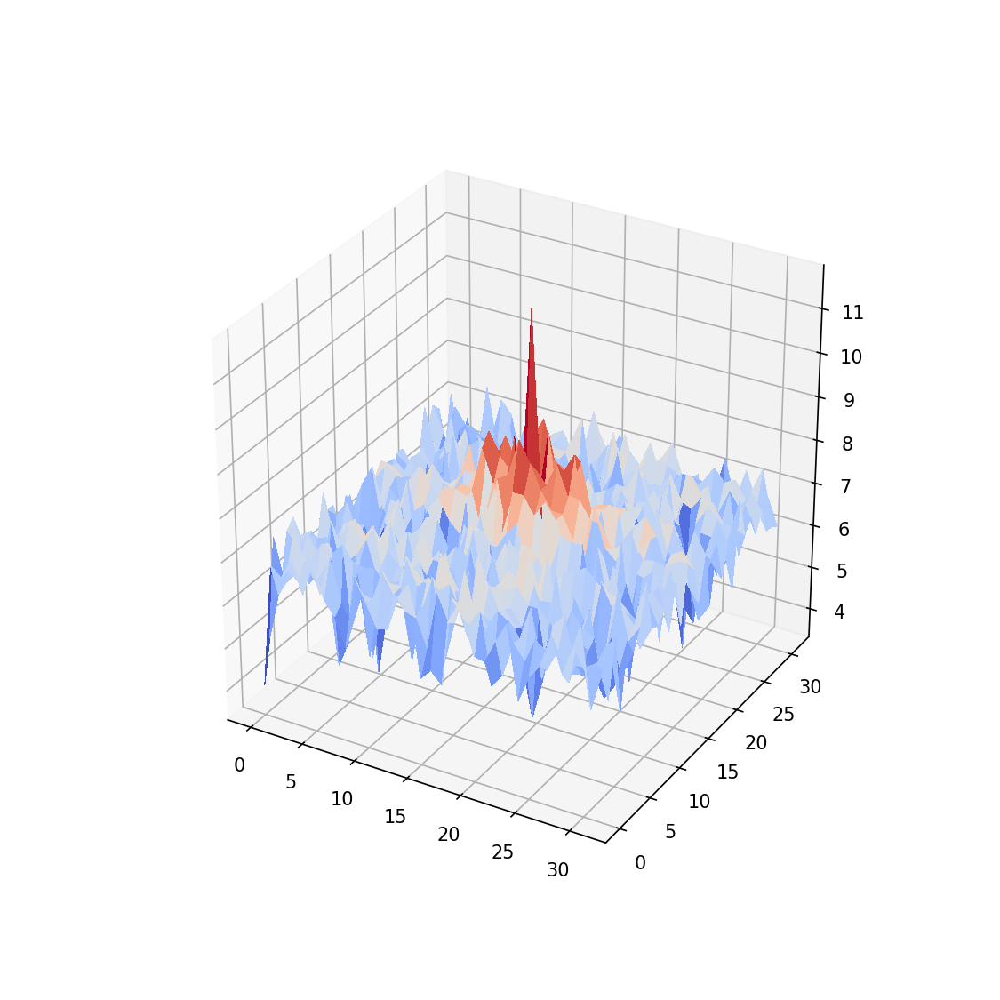

<IPython.core.display.Javascript object>


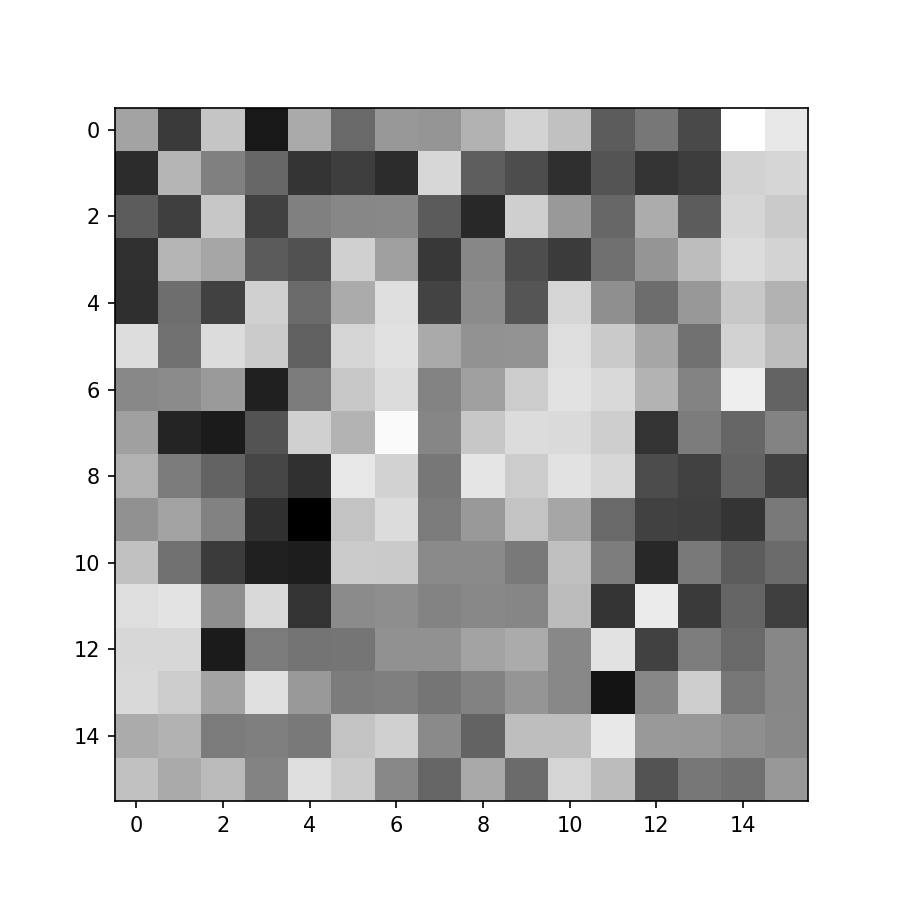

<IPython.core.display.Javascript object>


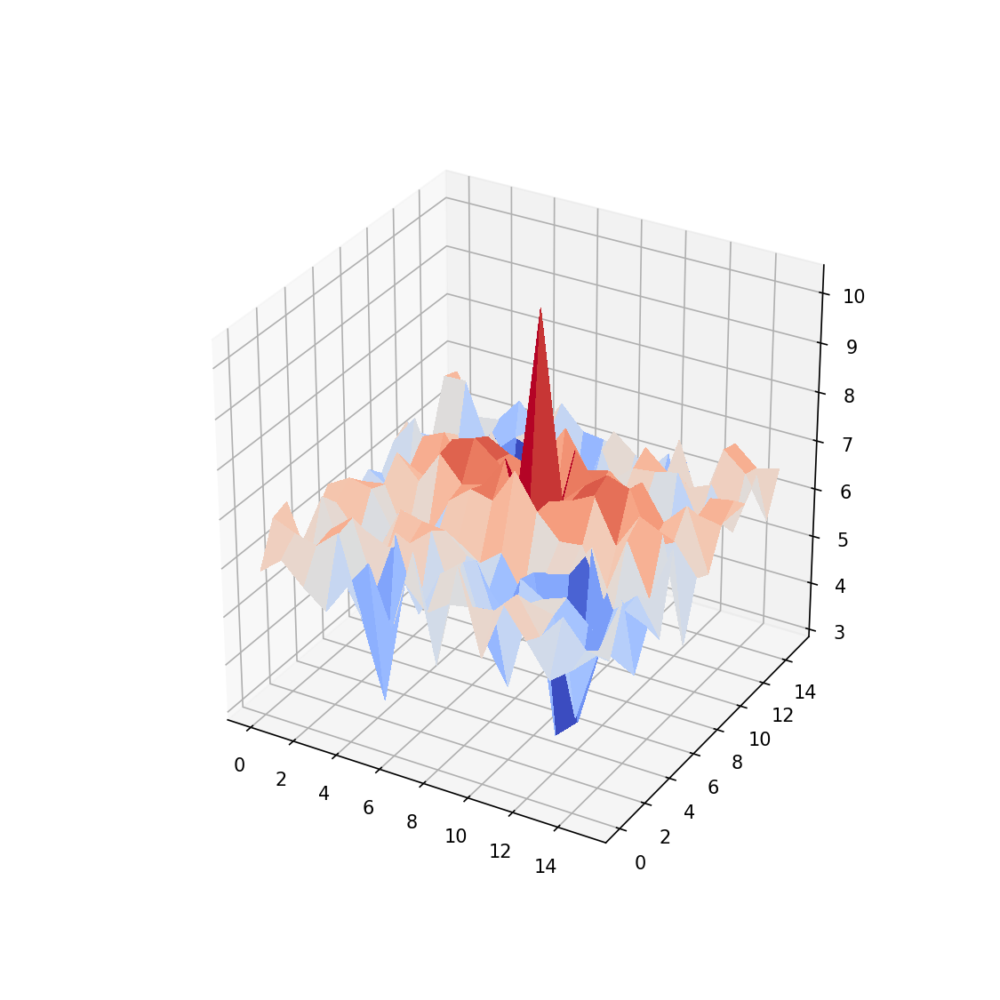

<IPython.core.display.Javascript object>


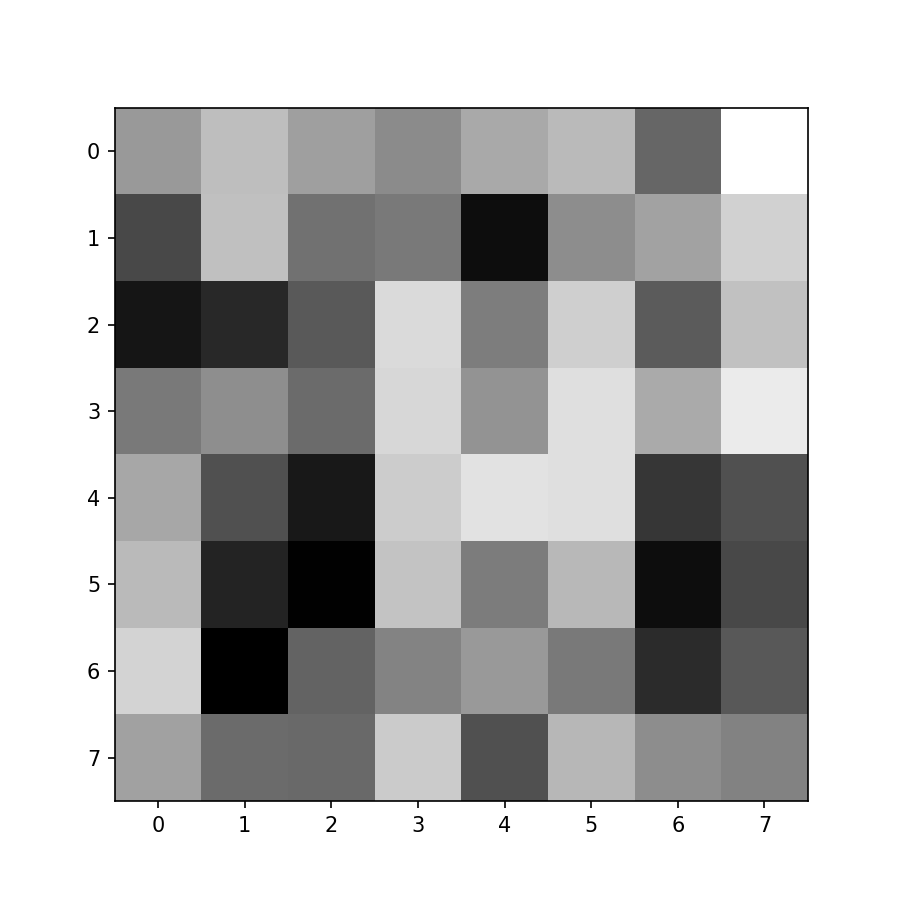

<IPython.core.display.Javascript object>


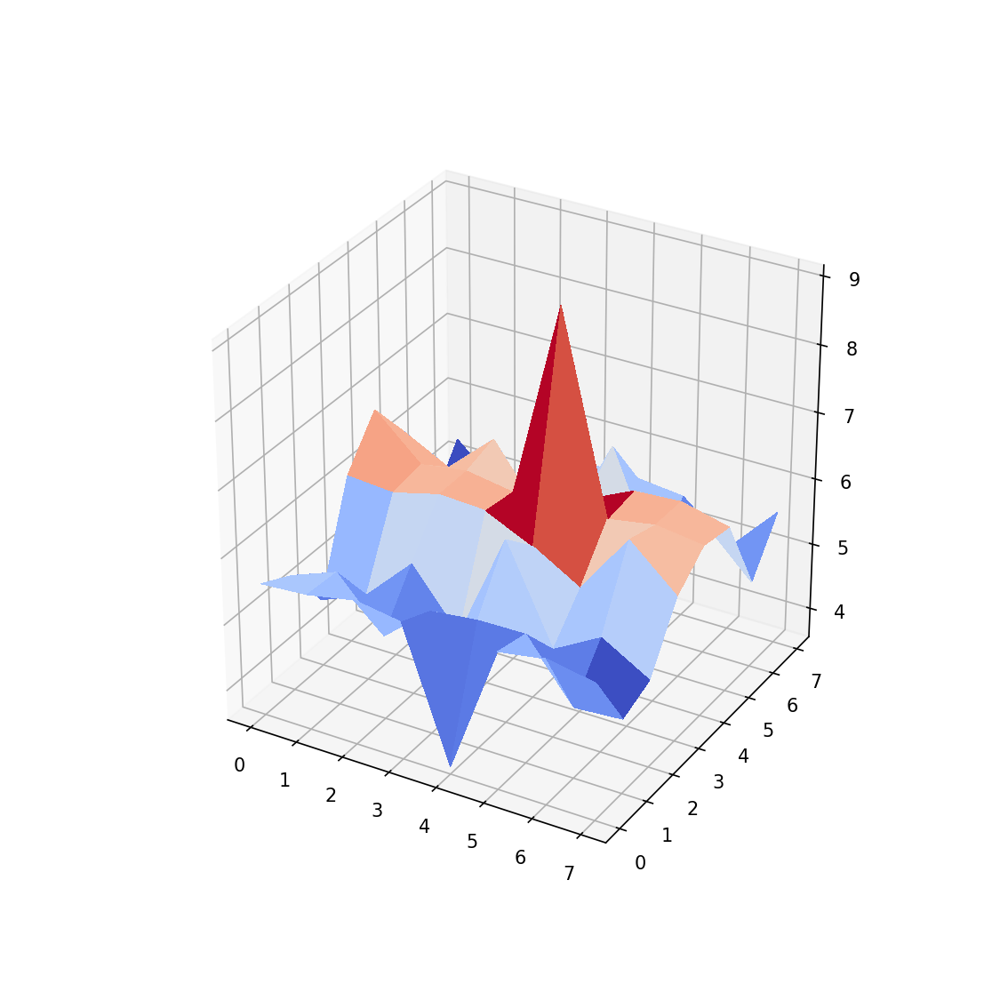

<IPython.core.display.Javascript object>


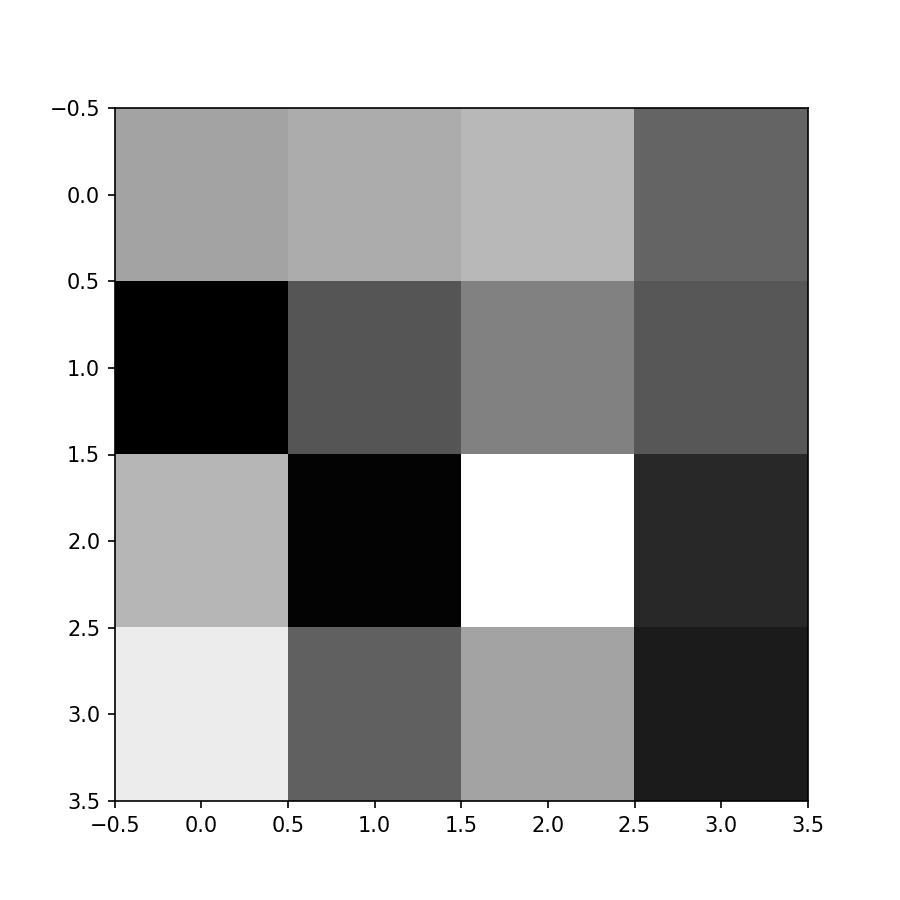

<IPython.core.display.Javascript object>


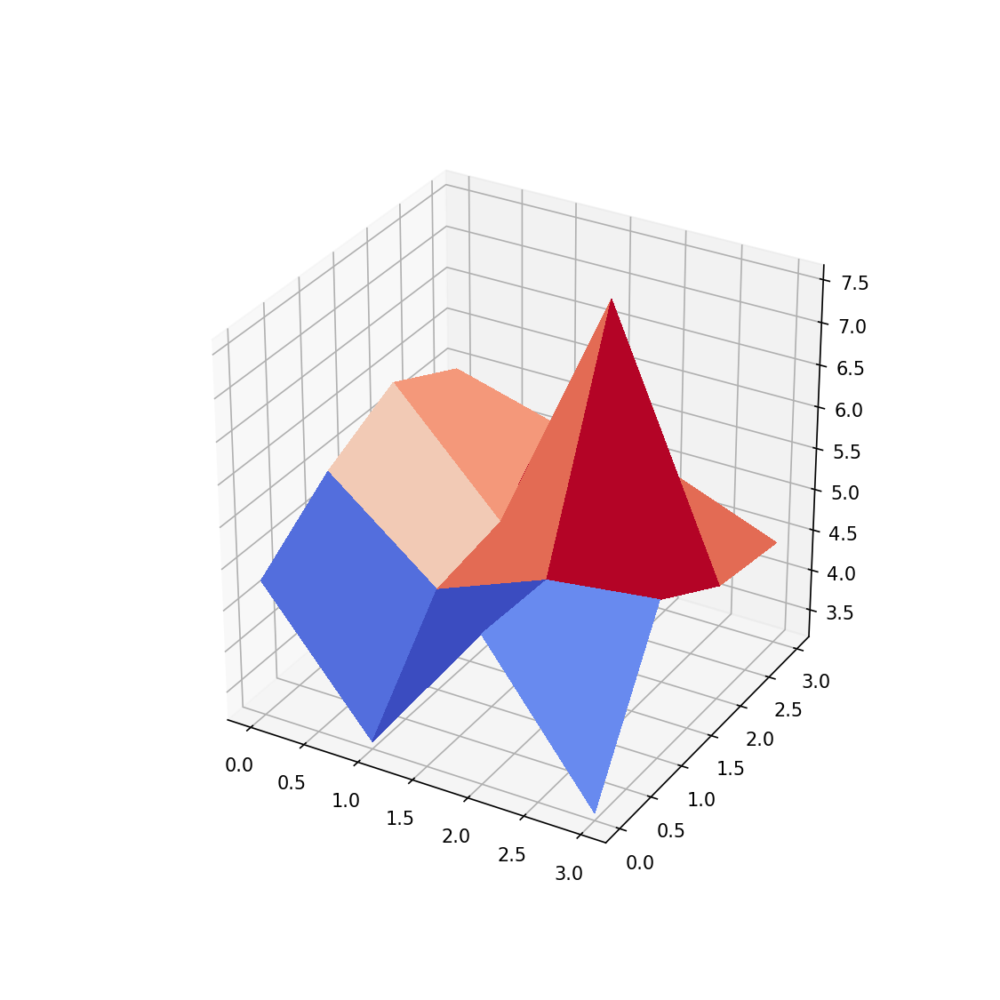

<IPython.core.display.Javascript object>


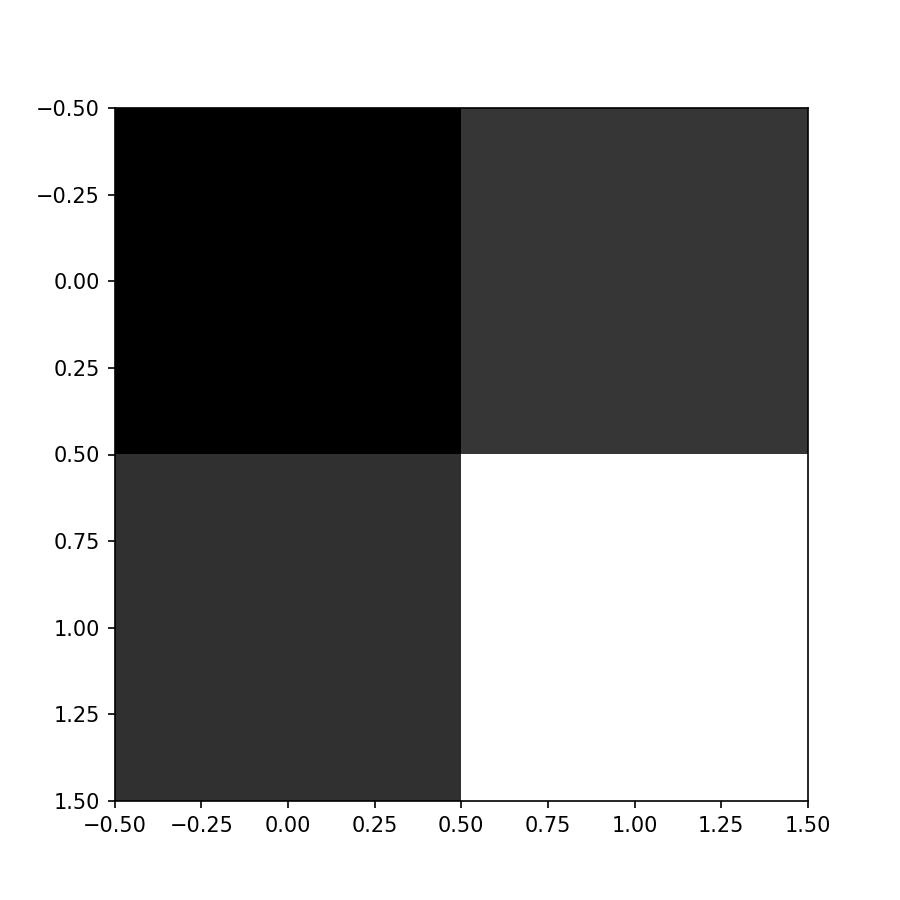

<IPython.core.display.Javascript object>


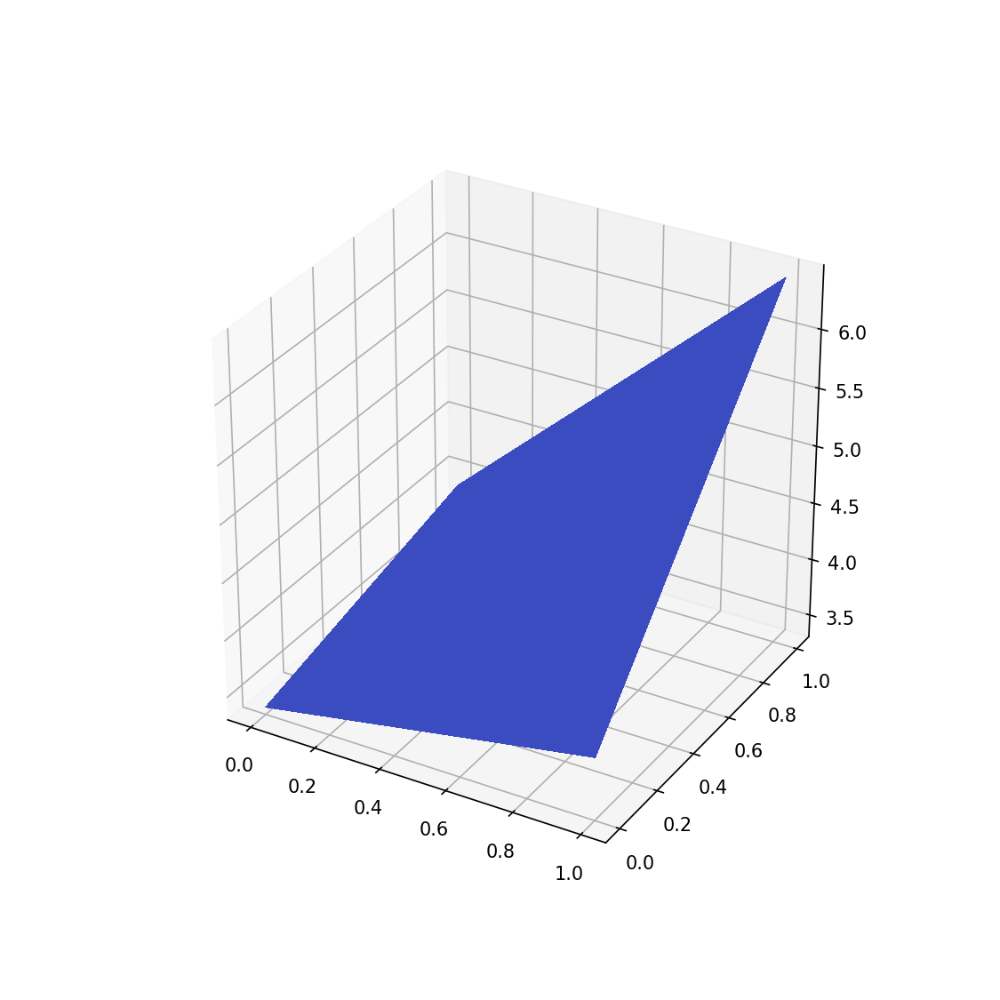

In [75]:
mandrill = np.array(Image.open('img/mandrill.png'))
### your code and comments start below

varBool=False
subSample=mandrill
imshow(subSample2(mandrill))
subSampleFT=fft2(subSample)
surf(toVisualizeLogFT(subSampleFT))


while(not varBool):
    subSample=subSample2(subSample)
    imshow(subSample)
    subSampleFT=fft2(subSample)
    surf(toVisualizeLogFT(subSampleFT))
    if(np.shape(subSample)[0]<=2 and np.shape(subSample)[0]<=2):
        varBool=True